In [1]:
import torch
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import PolynomialLR
from torch.utils.data import WeightedRandomSampler
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2

from tqdm.notebook import tqdm
import json
import cv2
import numpy as np
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import  plot_some_images ,read_images , pre_hard_skeletonize , pre_soft_skeletonize,compute_confution_matrix
from utils.preprocessing import WhiteTopHat , CLAHE , normalize_xca
from utils.dataset import  UnetDataset , ValidUnetDataset
from models.nnunet import nnUnet
from models.nnunet_blocks import nnUnetv2
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###

# Training

In [ ]:
args = {
    "base_path" : "../arcade/nnUnet_dataset/syntax",
    "in_c" : 1,
    "base_channel" :32,
    "image_shape" : (512,512),
    "class_count" : 26 ,
    "attention" : False,
    "k":40,
    "batch_size" : 10,
    "num_workers" : 10,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "lr" : 0.01,
    "momentum" : 0.99,
    "weight_decay" : 3e-5,
    "epcohs":200,
    "f_int_scale" : 2,
    "full_report_cycle" : 10,
    "max_channels":512,
    "input_channels":1,
    "unet_depth":2,
    "loss_type":"tversky loss",
    "alpha":0.3,
    "beta":0.7,
    "t_gamma":2.00,
    "f_gamma":2.0,
    "f_loss_scale":1,
    "loss_coefs":{"CE":0.5,"Second":1.0},
    "output_base_path" : "./outputs",
    "name" : "NoAttention7-DSV-tev-new_augs_full",
    "deep_super_vision" : True,
    "f_alpha":None
}
class_map = {
    1: '1',2: '2', 3: '3',4: '4',
    5: '5',6: '6',7: '7',8: '8',
    9: '9',10: '9a',11: '10',12: '10a',
    13: '11',14: '12',15: '12a',16: '13',
    17: '14',18: '14a',19: '15',20: '16',
    21: '16a',22: '16b',23: '16c',
    24: '12b',25: '14b'
}
train_class_counts = [
    1000,374,375,369,303,525,525,
    340,310,198,70,21,1,320,61,
    129,305,107,49,38,232,43,48,31,63,127
]
# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","CE loss",args["loss_type"]]
out_counts = 4 if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights

[1.0, 0.5, 0.25, 0.125]

In [ ]:
def class_weighting(method,class_counts,**kwargs):
    if(kwargs["use_pixel_counts"]):
        print("using pixel counts")
        with open("./data/train_class_counts.json","r") as f:
            train_class_counts = json.load(f)
        counts = [0]*(len(train_class_counts))
        for k,v in train_class_counts.items():
            counts[int(k)] = int(v)
        counts = np.array(counts,dtype=np.float64)
    else :
        print("using class counts")
        counts = np.array(class_counts,dtype=np.float64)

    if(method=="median"):
        print("median weights being used")
        median_count = np.median(counts)
        weights = median_count/np.array(counts)
        
    elif(method=="log"):
        print("log weights being used")
        total = np.sum(counts)
        weights = np.log(total/np.array(counts))
        weights = (weights / weights.mean())
        weights[0]=0.1
    elif(method=="beta"):
        print("beta weights being used")
        b = kwargs["b"]
        weights = (1-b)/(1-np.power(b,counts))
        weights = weights / weights.sum()
        weights[12] = 0.25
    else:
        print("no class weights being used")
        return None
    return weights.tolist()
args["f_alpha"] = class_weighting(method="log",class_counts=train_class_counts,b=0.999999,use_pixel_counts=False)
args["f_alpha"]

In [5]:
# pre_soft_skeletonize(args["base_path"],output_path=args["base_path"],batch_size=10,k=40)

In [6]:
train_transforms = A.Compose([
    # A.Resize(*args["image_shape"]),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.7),


    A.Affine(
        scale=(0.8, 1.2),             
        translate_percent=(-0.1, 0.1), 
        rotate=(-30, 30),         
        shear=(-10, 10),      
        

        fill=0,           
        fill_mask=0,                 
        border_mode=cv2.BORDER_CONSTANT, 
        
        fit_output=False,  
        p=0.7
    ),

    A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=0.5),

    A.RandomBrightnessContrast(
        brightness_limit=0.2, 
        contrast_limit=0.2, 
        p=0.5
    ),

    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    
    A.Lambda(image=normalize_xca)
])
test_transforms = A.Compose([
    # A.Resize(*args["image_shape"]),
    A.Lambda(image=normalize_xca),
    ToTensorV2()
    ]  
)
# train_preprocess = v2.Compose([
#     WhiteTopHat(kernel_size=(50,50)),
#     CLAHE()
    
# ])
train_preprocess = None


In [7]:
def make_dataloader(data,args,valid=False,sampler_weights=None):
    if(sampler_weights is not None):
        print("using weighted sampler here")
        sampler = WeightedRandomSampler(sampler_weights, len(sampler_weights))
        dataloader = DataLoader(
            data,
            batch_size = args["batch_size"] ,
            num_workers = args["num_workers"] ,
            pin_memory=True,
            shuffle=False,
            sampler=sampler
        )
        
    else : 
        if(valid):
            print("valid with no sampler")
            dataloader = DataLoader(
                data,
                batch_size = args["batch_size"] ,
                num_workers = args["num_workers"] ,
                pin_memory=True,
                shuffle=False,
            )
        else : 
            print("train with no sampler")
            dataloader = DataLoader(
                data,
                batch_size = args["batch_size"] ,
                num_workers = args["num_workers"] ,
                pin_memory=True,
                shuffle=True
            )
    return dataloader

In [8]:

train_images,sampler_weights = read_images(
    base_path = args["base_path"],
    preprocessor = train_preprocess,
    part = "train",
    train_class_counts=np.array(train_class_counts)
)
valid_images = read_images(
    base_path = args["base_path"],
    preprocessor = train_preprocess,
    part = "val",
    train_class_counts=None
)
train_ds = UnetDataset(transform = train_transforms,data = train_images,base_size=args["image_shape"][0],out_counts=out_counts)
valid_ds = ValidUnetDataset(transform = test_transforms,data = valid_images)

train_loader = make_dataloader(train_ds,args,valid=False,sampler_weights=sampler_weights)
valid_loader = make_dataloader(valid_ds,args,valid=True,sampler_weights=None)

max count is :  525
NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

using weighted sampler here
valid with no sampler


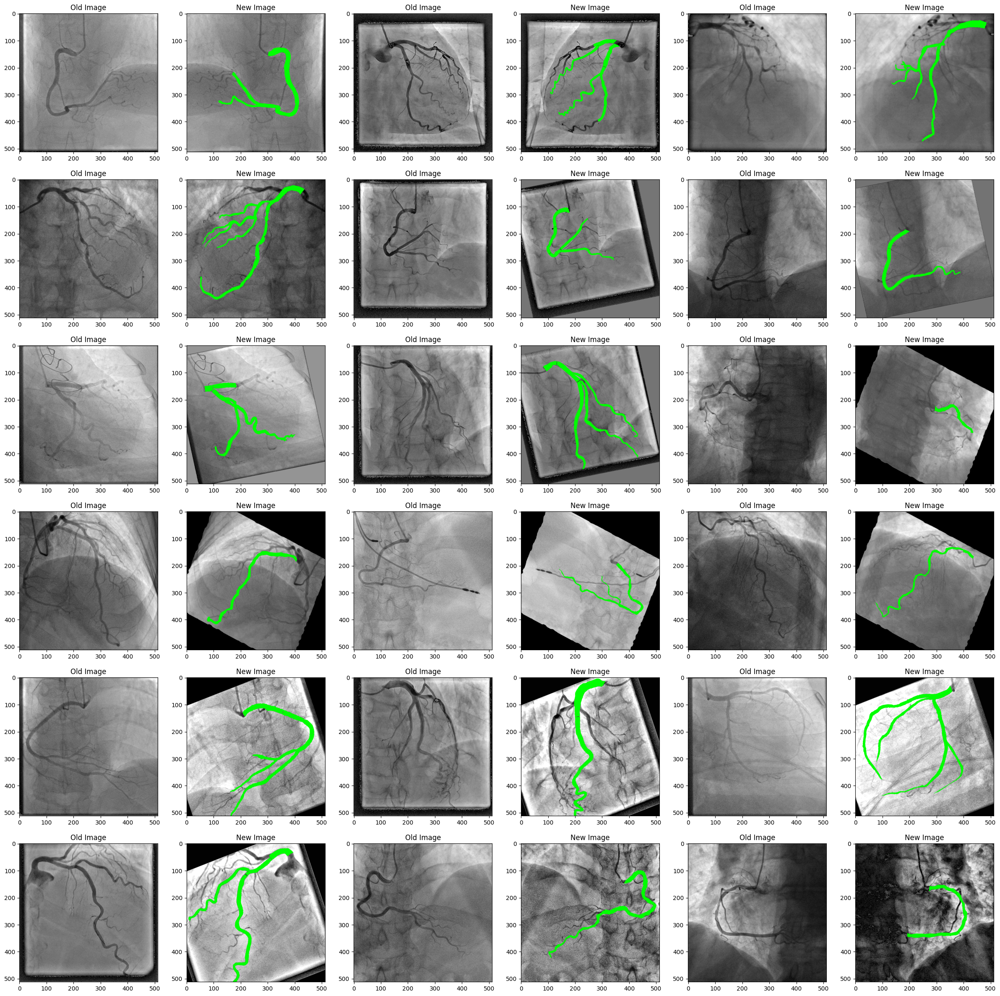

In [9]:
plot_some_images(train_images, train_transforms, image_counts=36, fig_shape=(6,6), base_transforms=test_transforms)

In [10]:
model = nnUnet(args).to(args["device"])
loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(model.parameters(), lr=args["lr"])
optimizer = torch.optim.SGD(
    model.parameters(),
    momentum=args["momentum"],
    lr=args["lr"],
    nesterov=True,
    weight_decay=args["weight_decay"]
)
lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map)

best_model =trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)

number of layers : 4
encoder settings :  [32, 64, 128, 256]
bottle-neck settings :  512
decoder settings :  [256, 128, 64]
head settings :  26
loss is set to tversky


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.01
train ==> epcoh (0)
total loss : 3.1895583963394163 - CE loss : 1.3511240357160568 - tversky loss : 1.8384343600273132

train avg metrics for epoch 0 :
avg dice : 0.0016237945160571593 - avg precision : 0.002366088138660416 - avg recall : 0.004409985995298484
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 1.493704617023468 - CE loss : 0.5143524304032325 - tversky loss : 0.9793521940708161

valid avg metrics for epoch 0 :
avg dice : 4.2089329715727303e-13 - avg precision : 0.0 - avg recall : 0.0
------------------------------------------------------------
New Best! : dice = 4.2089332778598443e-13


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009955
train ==> epcoh (1)
total loss : 2.7525125098228456 - CE loss : 0.9358072578907013 - tversky loss : 1.8167052531242371

train avg metrics for epoch 1 :
avg dice : 4.394039951636846e-14 - avg precision : 0.0 - avg recall : 0.0
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 1.4353907704353333 - CE loss : 0.4665275186300278 - tversky loss : 0.9688632547855377

valid avg metrics for epoch 1 :
avg dice : 4.2081947328924743e-13 - avg precision : 0.0 - avg recall : 0.0
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00991
train ==> epcoh (2)
total loss : 2.650826141834259 - CE loss : 0.8642958706617355 - tversky loss : 1.7865302777290344

train avg metrics for epoch 2 :
avg dice : 0.001064472794576269 - avg precision : 0.0006975352764129639 - avg recall : 0.0022459544241428377
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 1.4041978240013122 - CE loss : 0.44261094331741335 - tversky loss : 0.96158686876297

valid avg metrics for epoch 2 :
avg dice : 0.0005790660161966042 - avg precision : 0.0003227672353386879 - avg recall : 0.0028119140863418577
------------------------------------------------------------
New Best! : dice = 0.0005790659924969077


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009865
train ==> epcoh (3)
total loss : 2.5983081459999084 - CE loss : 0.8396602487564087 - tversky loss : 1.7586478984355927

train avg metrics for epoch 3 :
avg dice : 0.00822310153573557 - avg precision : 0.01216738112270832 - avg recall : 0.011563627681753133
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 1.3734017312526703 - CE loss : 0.42276198118925096 - tversky loss : 0.9506397604942322

valid avg metrics for epoch 3 :
avg dice : 0.009362028362936438 - avg precision : 0.00555955721065402 - avg recall : 0.03504055005556438
------------------------------------------------------------
New Best! : dice = 0.00936202798038721


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00982
train ==> epcoh (4)
total loss : 2.506179442405701 - CE loss : 0.7875556486845017 - tversky loss : 1.7186237788200378

train avg metrics for epoch 4 :
avg dice : 0.011758826375050532 - avg precision : 0.008548426032066346 - avg recall : 0.038822278827428815
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 1.3331823587417602 - CE loss : 0.402603904902935 - tversky loss : 0.9305784583091736

valid avg metrics for epoch 4 :
avg dice : 0.016519882679401524 - avg precision : 0.010644568800926209 - avg recall : 0.046027108430862426
------------------------------------------------------------
New Best! : dice = 0.016519881784915924


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009775
train ==> epcoh (5)
total loss : 2.44704265832901 - CE loss : 0.7715022921562195 - tversky loss : 1.6755403661727906

train avg metrics for epoch 5 :
avg dice : 0.029006087745447263 - avg precision : 0.027779107242822648 - avg recall : 0.049148626498972586
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 1.3148300409317017 - CE loss : 0.3903363823890686 - tversky loss : 0.9244936525821685

valid avg metrics for epoch 5 :
avg dice : 0.025231332355584023 - avg precision : 0.027958782911300658 - avg recall : 0.050193023202009496
------------------------------------------------------------
New Best! : dice = 0.025231333449482918


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00973
train ==> epcoh (6)
total loss : 2.361808819770813 - CE loss : 0.7295068055391312 - tversky loss : 1.6323020207881926

train avg metrics for epoch 6 :
avg dice : 0.03827609014701268 - avg precision : 0.03447636693716049 - avg recall : 0.05736537816002965
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 1.2955864429473878 - CE loss : 0.3803360670804977 - tversky loss : 0.9152503788471222

valid avg metrics for epoch 6 :
avg dice : 0.04235106343443301 - avg precision : 0.036396050974726674 - avg recall : 0.06441973118111491
------------------------------------------------------------
New Best! : dice = 0.04235106334090233


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009684
train ==> epcoh (7)
total loss : 2.3103309416770936 - CE loss : 0.7272128754854202 - tversky loss : 1.5831180644035339

train avg metrics for epoch 7 :
avg dice : 0.04037478665300933 - avg precision : 0.03620505824685097 - avg recall : 0.07219219134003652
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 1.2824388682842254 - CE loss : 0.37542800009250643 - tversky loss : 0.9070108622312546

valid avg metrics for epoch 7 :
avg dice : 0.041392464768539944 - avg precision : 0.034418492689728734 - avg recall : 0.07567001468036323
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009639
train ==> epcoh (8)
total loss : 2.256440463066101 - CE loss : 0.706757378578186 - tversky loss : 1.549683096408844

train avg metrics for epoch 8 :
avg dice : 0.050896924991302016 - avg precision : 0.04320412246510386 - avg recall : 0.08532856598638318
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 1.257047176361084 - CE loss : 0.36542357355356214 - tversky loss : 0.8916236102581024

valid avg metrics for epoch 8 :
avg dice : 0.052504229301805073 - avg precision : 0.044765855446457864 - avg recall : 0.09384957565518562
------------------------------------------------------------
New Best! : dice = 0.05250423029065132


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009594
train ==> epcoh (9)
total loss : 2.1505194902420044 - CE loss : 0.6757954829931259 - tversky loss : 1.4747240149974823

train avg metrics for epoch 9 :
avg dice : 0.07044919557407125 - avg precision : 0.06955802410840989 - avg recall : 0.1225515303038992
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 1.2287940979003906 - CE loss : 0.3692084789276123 - tversky loss : 0.8595856159925461

valid avg metrics for epoch 9 :
avg dice : 0.07625233463981439 - avg precision : 0.06721989616751671 - avg recall : 0.1384552655182779
1 => dice : 0.19092027842998505 p : 0.1415427029132843 , r : 0.2932060658931732
2 => dice : 7.042799096733734e-14 p : 0.0 , r : 0.0
3 => dice : 8.138352188338804e-14 p : 0.0 , r : 0.0
4 => dice : 1.142556779439377e-13 p : 0.0 , r : 0.0
5 => dice : 0.6412125825881958 p : 0.5553979277610779 , r : 0.7583919167518616
6 => dice : 0.20693595707416534 p : 0.19320940971374512 , r : 0.2227620780467987
7 => dice :

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009549
train ==> epcoh (10)
total loss : 2.0321882510185243 - CE loss : 0.6421431401371955 - tversky loss : 1.3900451231002808

train avg metrics for epoch 10 :
avg dice : 0.10209451447419077 - avg precision : 0.09299549706280232 - avg recall : 0.1633640009065857
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (10)
total loss : 1.1522475838661195 - CE loss : 0.35741349309682846 - tversky loss : 0.7948340892791748

valid avg metrics for epoch 10 :
avg dice : 0.10639832679219112 - avg precision : 0.107772156894207 - avg recall : 0.17210959997028114
------------------------------------------------------------
New Best! : dice = 0.1063983216881752


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009504
train ==> epcoh (11)
total loss : 1.927801592350006 - CE loss : 0.6359509739279747 - tversky loss : 1.2918506205081939

train avg metrics for epoch 11 :
avg dice : 0.16564261805137515 - avg precision : 0.16360107891261577 - avg recall : 0.2162531016970388
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (11)
total loss : 1.0623955398797988 - CE loss : 0.34524406790733336 - tversky loss : 0.7171514600515365

valid avg metrics for epoch 11 :
avg dice : 0.16448672152964583 - avg precision : 0.16267346076667308 - avg recall : 0.22696168823254992
------------------------------------------------------------
New Best! : dice = 0.16448673605918884


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009458
train ==> epcoh (12)
total loss : 1.8064953184127808 - CE loss : 0.6126749667525292 - tversky loss : 1.1938203549385071

train avg metrics for epoch 12 :
avg dice : 0.21860388380652232 - avg precision : 0.19501406213268638 - avg recall : 0.2868246638643905
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (12)
total loss : 1.0345011800527573 - CE loss : 0.3459372386336327 - tversky loss : 0.6885639488697052

valid avg metrics for epoch 12 :
avg dice : 0.1922370221468213 - avg precision : 0.191952755600214 - avg recall : 0.25894294667523354
------------------------------------------------------------
New Best! : dice = 0.1922370344400406


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009413
train ==> epcoh (13)
total loss : 1.7165665423870087 - CE loss : 0.5791872406005859 - tversky loss : 1.137379304766655

train avg metrics for epoch 13 :
avg dice : 0.25144049768802257 - avg precision : 0.242848169952631 - avg recall : 0.32324222835246474
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (13)
total loss : 0.9872422546148301 - CE loss : 0.34082655906677245 - tversky loss : 0.6464156955480576

valid avg metrics for epoch 13 :
avg dice : 0.22296288345031176 - avg precision : 0.1996010435372591 - avg recall : 0.28606159694492816
------------------------------------------------------------
New Best! : dice = 0.2229629009962082


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009368
train ==> epcoh (14)
total loss : 1.685030391216278 - CE loss : 0.58142324000597 - tversky loss : 1.1036071628332138

train avg metrics for epoch 14 :
avg dice : 0.26978367231757994 - avg precision : 0.2461108222324401 - avg recall : 0.3312623101101781
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (14)
total loss : 0.9391576468944549 - CE loss : 0.3069196157157421 - tversky loss : 0.6322380244731903

valid avg metrics for epoch 14 :
avg dice : 0.24413558959397175 - avg precision : 0.23563729282468557 - avg recall : 0.28868455489340705
------------------------------------------------------------
New Best! : dice = 0.24413560330867767


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009322
train ==> epcoh (15)
total loss : 1.588507399559021 - CE loss : 0.5478499299287796 - tversky loss : 1.0406574708223344

train avg metrics for epoch 15 :
avg dice : 0.30060425927863316 - avg precision : 0.2738869300484657 - avg recall : 0.35852196693420413
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (15)
total loss : 0.9177000910043717 - CE loss : 0.2998583935201168 - tversky loss : 0.6178416937589646

valid avg metrics for epoch 15 :
avg dice : 0.25994102172563627 - avg precision : 0.24056899094954132 - avg recall : 0.3053974952280987
------------------------------------------------------------
New Best! : dice = 0.2599410116672516


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009277
train ==> epcoh (16)
total loss : 1.5205303704738617 - CE loss : 0.52878483325243 - tversky loss : 0.9917455339431762

train avg metrics for epoch 16 :
avg dice : 0.3218869538605213 - avg precision : 0.2922388783842325 - avg recall : 0.3767537869885564
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (16)
total loss : 0.9494140416383743 - CE loss : 0.33478743955492973 - tversky loss : 0.6146265953779221

valid avg metrics for epoch 16 :
avg dice : 0.26306321769971835 - avg precision : 0.26059914752840996 - avg recall : 0.293557971380651
------------------------------------------------------------
New Best! : dice = 0.2630632519721985


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009232
train ==> epcoh (17)
total loss : 1.4741879272460938 - CE loss : 0.503057476580143 - tversky loss : 0.9711304467916488

train avg metrics for epoch 17 :
avg dice : 0.32988047951679617 - avg precision : 0.3036421342566609 - avg recall : 0.39455609699547495
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (17)
total loss : 0.90953548848629 - CE loss : 0.3124861590564251 - tversky loss : 0.5970493271946907

valid avg metrics for epoch 17 :
avg dice : 0.26716016605967907 - avg precision : 0.26771517142653467 - avg recall : 0.3094696245994419
------------------------------------------------------------
New Best! : dice = 0.26716017723083496


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009186
train ==> epcoh (18)
total loss : 1.4008480083942414 - CE loss : 0.47662726253271104 - tversky loss : 0.9242207527160644

train avg metrics for epoch 18 :
avg dice : 0.3452288044989109 - avg precision : 0.30962991155683994 - avg recall : 0.40382126860320566
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (18)
total loss : 0.8818809628486634 - CE loss : 0.30121190994977953 - tversky loss : 0.5806690484285355

valid avg metrics for epoch 18 :
avg dice : 0.26711909998217165 - avg precision : 0.24558351557701827 - avg recall : 0.33476621835376136
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009141
train ==> epcoh (19)
total loss : 1.428912982940674 - CE loss : 0.4957293954491615 - tversky loss : 0.9331836003065109

train avg metrics for epoch 19 :
avg dice : 0.34471600618679077 - avg precision : 0.30642070777714253 - avg recall : 0.4099129735131282
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (19)
total loss : 0.8831935048103332 - CE loss : 0.29919260144233706 - tversky loss : 0.584000900387764

valid avg metrics for epoch 19 :
avg dice : 0.26681123311639343 - avg precision : 0.2515770060196519 - avg recall : 0.32797515399754046
1 => dice : 0.6787683367729187 p : 0.7208997011184692 , r : 0.6412895321846008
2 => dice : 0.5966727137565613 p : 0.5929790139198303 , r : 0.6004127264022827
3 => dice : 0.6245079636573792 p : 0.5729408860206604 , r : 0.6862756013870239
4 => dice : 0.3535866439342499 p : 0.2544091045856476 , r : 0.5794934034347534
5 => dice : 0.6582425832748413 p : 0.6298466920852661 , r : 0.6893197298049927
6 => dice

  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(2.0153, device='cuda:0')
current lr : 0.009095
train ==> epcoh (20)
total loss : 1.3524461781978607 - CE loss : 0.46359376788139345 - tversky loss : 0.8888524049520492

train avg metrics for epoch 20 :
avg dice : 0.3641318503022194 - avg precision : 0.32397101387381555 - avg recall : 0.4293893093429506
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (20)
total loss : 0.9005149692296982 - CE loss : 0.30342044681310654 - tversky loss : 0.5970945224165917

valid avg metrics for epoch 20 :
avg dice : 0.2727984023841142 - avg precision : 0.25570182636380195 - avg recall : 0.33643785659223796
------------------------------------------------------------
New Best! : dice = 0.27279841899871826


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.2230, device='cuda:0')
current lr : 0.00905
train ==> epcoh (21)
total loss : 1.341683088541031 - CE loss : 0.4554533815383911 - tversky loss : 0.8862296897172928

train avg metrics for epoch 21 :
avg dice : 0.36388618032913655 - avg precision : 0.32192490935325624 - avg recall : 0.43016875548521055
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (21)
total loss : 0.7938717782497406 - CE loss : 0.26829829066991806 - tversky loss : 0.5255734845995903

valid avg metrics for epoch 21 :
avg dice : 0.3114943073015371 - avg precision : 0.2878525346517563 - avg recall : 0.3832668657437898
------------------------------------------------------------
New Best! : dice = 0.31149429082870483


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009004
train ==> epcoh (22)
total loss : 1.254922909140587 - CE loss : 0.4337844778597355 - tversky loss : 0.8211384427547455

train avg metrics for epoch 22 :
avg dice : 0.392140791118145 - avg precision : 0.35169708862900734 - avg recall : 0.4606610016501509
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (22)
total loss : 0.8544516831636428 - CE loss : 0.2791405454277992 - tversky loss : 0.5753111511468887

valid avg metrics for epoch 22 :
avg dice : 0.296637598853679 - avg precision : 0.2949993877857924 - avg recall : 0.3515743856690824
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008959
train ==> epcoh (23)
total loss : 1.3024133533239364 - CE loss : 0.44431137025356293 - tversky loss : 0.8581019860506057

train avg metrics for epoch 23 :
avg dice : 0.3852499413490328 - avg precision : 0.3414971309900284 - avg recall : 0.4611388775706291
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (23)
total loss : 0.7938905149698258 - CE loss : 0.26698475554585455 - tversky loss : 0.5269057586789131

valid avg metrics for epoch 23 :
avg dice : 0.298646877296332 - avg precision : 0.26347684282809497 - avg recall : 0.39553435653448105
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008913
train ==> epcoh (24)
total loss : 1.2667126899957657 - CE loss : 0.42827828794717787 - tversky loss : 0.8384344011545182

train avg metrics for epoch 24 :
avg dice : 0.3900797097245231 - avg precision : 0.3453219853341579 - avg recall : 0.47011229263385756
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (24)
total loss : 0.8253927648067474 - CE loss : 0.2841381080448627 - tversky loss : 0.5412546575069428

valid avg metrics for epoch 24 :
avg dice : 0.301760868802809 - avg precision : 0.2816232967749238 - avg recall : 0.37473792654462157
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008868
train ==> epcoh (25)
total loss : 1.2283675044775009 - CE loss : 0.4298237854242325 - tversky loss : 0.7985437178611755

train avg metrics for epoch 25 :
avg dice : 0.4028614643216133 - avg precision : 0.3579730480909348 - avg recall : 0.47647318758070467
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (25)
total loss : 0.7967341423034668 - CE loss : 0.26742003187537194 - tversky loss : 0.5293141201138496

valid avg metrics for epoch 25 :
avg dice : 0.30696204609833694 - avg precision : 0.27629172677639874 - avg recall : 0.39458191263460324
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008822
train ==> epcoh (26)
total loss : 1.244690083861351 - CE loss : 0.43038295716047287 - tversky loss : 0.8143071299791336

train avg metrics for epoch 26 :
avg dice : 0.4054062208533287 - avg precision : 0.35910044312477113 - avg recall : 0.48444760343059895
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (26)
total loss : 0.8055534183979034 - CE loss : 0.2675620079040527 - tversky loss : 0.5379914075136185

valid avg metrics for epoch 26 :
avg dice : 0.30506136134273276 - avg precision : 0.28257978543639184 - avg recall : 0.3854938668757677
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008776
train ==> epcoh (27)
total loss : 1.2280366200208663 - CE loss : 0.41470142841339114 - tversky loss : 0.8133351975679397

train avg metrics for epoch 27 :
avg dice : 0.40500073041417634 - avg precision : 0.3575529817398638 - avg recall : 0.49234099135399445
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (27)
total loss : 0.792597645521164 - CE loss : 0.2762291729450226 - tversky loss : 0.5163684636354446

valid avg metrics for epoch 27 :
avg dice : 0.3155417642790396 - avg precision : 0.30012686535716054 - avg recall : 0.39219904512399806
------------------------------------------------------------
New Best! : dice = 0.3155417740345001


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008731
train ==> epcoh (28)
total loss : 1.2023025918006898 - CE loss : 0.40064036518335344 - tversky loss : 0.8016622245311738

train avg metrics for epoch 28 :
avg dice : 0.41348664436489346 - avg precision : 0.36641821905970573 - avg recall : 0.4927354705519974
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (28)
total loss : 0.7797502487897873 - CE loss : 0.2597604401409626 - tversky loss : 0.5199898034334183

valid avg metrics for epoch 28 :
avg dice : 0.32043638426736737 - avg precision : 0.30469057904556396 - avg recall : 0.39959378669613216
------------------------------------------------------------
New Best! : dice = 0.32043638825416565


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008685
train ==> epcoh (29)
total loss : 1.1594986188411713 - CE loss : 0.39910730481147766 - tversky loss : 0.760391303896904

train avg metrics for epoch 29 :
avg dice : 0.4231488527357578 - avg precision : 0.3765030139684677 - avg recall : 0.5065068741887808
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (29)
total loss : 0.760756179690361 - CE loss : 0.2600933127105236 - tversky loss : 0.5006628707051277

valid avg metrics for epoch 29 :
avg dice : 0.3406030211714488 - avg precision : 0.3214301985409111 - avg recall : 0.4043614884209819
1 => dice : 0.6692812442779541 p : 0.6975356936454773 , r : 0.643226683139801
2 => dice : 0.6580391526222229 p : 0.7117902636528015 , r : 0.6118361353874207
3 => dice : 0.6346648931503296 p : 0.5783712267875671 , r : 0.7030984163284302
4 => dice : 0.44735050201416016 p : 0.3455590307712555 , r : 0.6341533064842224
5 => dice : 0.7345772981643677 p : 0.7662803530693054 , r : 0.7053933143615723
6 => dice : 0

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008639
train ==> epcoh (30)
total loss : 1.170139627456665 - CE loss : 0.3996059636771679 - tversky loss : 0.7705336636304856

train avg metrics for epoch 30 :
avg dice : 0.4279943192005157 - avg precision : 0.3798675340414047 - avg recall : 0.5136220760643482
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (30)
total loss : 0.775624293088913 - CE loss : 0.27203175276517866 - tversky loss : 0.5035925447940827

valid avg metrics for epoch 30 :
avg dice : 0.32294132299723716 - avg precision : 0.299837451800704 - avg recall : 0.4075699734315276
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008594
train ==> epcoh (31)
total loss : 1.1445443952083587 - CE loss : 0.39838798880577087 - tversky loss : 0.7461564058065414

train avg metrics for epoch 31 :
avg dice : 0.43212611228227615 - avg precision : 0.38488586753606796 - avg recall : 0.5160291322320699
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (31)
total loss : 0.7658387690782547 - CE loss : 0.25779677703976633 - tversky loss : 0.5080419898033142

valid avg metrics for epoch 31 :
avg dice : 0.32657547251857516 - avg precision : 0.3184263789653778 - avg recall : 0.3936531205708161
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008548
train ==> epcoh (32)
total loss : 1.0984075301885605 - CE loss : 0.3785483403503895 - tversky loss : 0.7198591923713684

train avg metrics for epoch 32 :
avg dice : 0.4358034214377403 - avg precision : 0.38786080926656724 - avg recall : 0.5195633060485124
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (32)
total loss : 0.7350318044424057 - CE loss : 0.24076499193906784 - tversky loss : 0.4942668154835701

valid avg metrics for epoch 32 :
avg dice : 0.3340826538486014 - avg precision : 0.30306028567254545 - avg recall : 0.4139008291158825
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008502
train ==> epcoh (33)
total loss : 1.0776779657602311 - CE loss : 0.37382065296173095 - tversky loss : 0.7038573145866394

train avg metrics for epoch 33 :
avg dice : 0.44825022876262666 - avg precision : 0.40031724363565446 - avg recall : 0.5313812628388405
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (33)
total loss : 0.7357010453939438 - CE loss : 0.24978392124176024 - tversky loss : 0.48591712564229966

valid avg metrics for epoch 33 :
avg dice : 0.34734093286110335 - avg precision : 0.3150696788728237 - avg recall : 0.4294009244814515
------------------------------------------------------------
New Best! : dice = 0.3473409414291382


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008456
train ==> epcoh (34)
total loss : 1.0994696843624114 - CE loss : 0.3739656692743301 - tversky loss : 0.7255040195584297

train avg metrics for epoch 34 :
avg dice : 0.444694105386734 - avg precision : 0.3911962068080902 - avg recall : 0.5329205341264606
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (34)
total loss : 0.7270755469799042 - CE loss : 0.23839641213417054 - tversky loss : 0.48867913633584975

valid avg metrics for epoch 34 :
avg dice : 0.3403198050336145 - avg precision : 0.3230605971813202 - avg recall : 0.42058876434341075
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00841
train ==> epcoh (35)
total loss : 1.0702253949642182 - CE loss : 0.3699021200835705 - tversky loss : 0.7003232705593109

train avg metrics for epoch 35 :
avg dice : 0.45600835166871545 - avg precision : 0.4134813943505287 - avg recall : 0.5390332993865014
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (35)
total loss : 0.7428286164999008 - CE loss : 0.2585487328469753 - tversky loss : 0.48427988439798353

valid avg metrics for epoch 35 :
avg dice : 0.35656926324601274 - avg precision : 0.34616042375564576 - avg recall : 0.4228648579493165
------------------------------------------------------------
New Best! : dice = 0.3565692603588104


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008364
train ==> epcoh (36)
total loss : 1.0904482489824294 - CE loss : 0.3741438788175583 - tversky loss : 0.7163043743371964

train avg metrics for epoch 36 :
avg dice : 0.4615269386768341 - avg precision : 0.4088659483194351 - avg recall : 0.5480951923131943
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (36)
total loss : 0.7131999492645263 - CE loss : 0.2350045546889305 - tversky loss : 0.47819540053606036

valid avg metrics for epoch 36 :
avg dice : 0.3530957876053909 - avg precision : 0.32905349511653187 - avg recall : 0.4129245222778991
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008318
train ==> epcoh (37)
total loss : 1.0465229111909866 - CE loss : 0.36589125961065294 - tversky loss : 0.6806316530704498

train avg metrics for epoch 37 :
avg dice : 0.4647539632022381 - avg precision : 0.4091422000527382 - avg recall : 0.5537973557412624
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (37)
total loss : 0.7533441215753556 - CE loss : 0.266296274214983 - tversky loss : 0.48704784363508224

valid avg metrics for epoch 37 :
avg dice : 0.34583573296676035 - avg precision : 0.3105461346358061 - avg recall : 0.4373668429860845
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008272
train ==> epcoh (38)
total loss : 1.0480684620141982 - CE loss : 0.37001573011279104 - tversky loss : 0.6780527403950691

train avg metrics for epoch 38 :
avg dice : 0.4727583411335945 - avg precision : 0.4202680876851082 - avg recall : 0.5525233595073223
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (38)
total loss : 0.7292696863412857 - CE loss : 0.24887022525072097 - tversky loss : 0.48039945811033247

valid avg metrics for epoch 38 :
avg dice : 0.3467418079824344 - avg precision : 0.31070221081376076 - avg recall : 0.4385391715914011
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.9352, device='cuda:0')
current lr : 0.008227
train ==> epcoh (39)
total loss : 1.0514276289939881 - CE loss : 0.35630328983068466 - tversky loss : 0.695124340057373

train avg metrics for epoch 39 :
avg dice : 0.46855225652456284 - avg precision : 0.41481771469116213 - avg recall : 0.5600507572293282
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (39)
total loss : 0.696263587474823 - CE loss : 0.23226678892970085 - tversky loss : 0.46399679630994795

valid avg metrics for epoch 39 :
avg dice : 0.36860749021181866 - avg precision : 0.33605619162321093 - avg recall : 0.44243385173380373
1 => dice : 0.7073652148246765 p : 0.6419504284858704 , r : 0.787624180316925
2 => dice : 0.6523958444595337 p : 0.6702696084976196 , r : 0.6354506611824036
3 => dice : 0.6634274125099182 p : 0.5780262351036072 , r : 0.7784388065338135
4 => dice : 0.529849112033844 p : 0.5049058198928833 , r : 0.5573849081993103
5 => dice : 0.7352566719055176 p : 0

  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.1750, device='cuda:0')
current lr : 0.008181
train ==> epcoh (40)
total loss : 1.0178485369682313 - CE loss : 0.3508302411437035 - tversky loss : 0.6670182910561562

train avg metrics for epoch 40 :
avg dice : 0.47899904020130635 - avg precision : 0.422965469956398 - avg recall : 0.5671161212399602
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (40)
total loss : 0.6939363837242126 - CE loss : 0.234266696870327 - tversky loss : 0.4596696883440018

valid avg metrics for epoch 40 :
avg dice : 0.3684396079393163 - avg precision : 0.33569354593753814 - avg recall : 0.44427878822782074
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008134
train ==> epcoh (41)
total loss : 1.0184314501285554 - CE loss : 0.3559045779705048 - tversky loss : 0.6625268703699112

train avg metrics for epoch 41 :
avg dice : 0.48387674406170844 - avg precision : 0.4280915793776512 - avg recall : 0.5727227342128753
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (41)
total loss : 0.7295033693313598 - CE loss : 0.24902808144688607 - tversky loss : 0.48047528862953187

valid avg metrics for epoch 41 :
avg dice : 0.36004452388733627 - avg precision : 0.3298732184618711 - avg recall : 0.44646765081211925
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008088
train ==> epcoh (42)
total loss : 0.9552165651321411 - CE loss : 0.32310878723859787 - tversky loss : 0.6321077689528465

train avg metrics for epoch 42 :
avg dice : 0.49629337549209596 - avg precision : 0.43814188927412034 - avg recall : 0.5854184958338737
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (42)
total loss : 0.6852040648460388 - CE loss : 0.24036725610494614 - tversky loss : 0.44483681172132494

valid avg metrics for epoch 42 :
avg dice : 0.37213406510661073 - avg precision : 0.33406860269606115 - avg recall : 0.4668652292340994
------------------------------------------------------------
New Best! : dice = 0.3721340596675873


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008042
train ==> epcoh (43)
total loss : 0.9868332266807556 - CE loss : 0.35016840279102324 - tversky loss : 0.6366648238897323

train avg metrics for epoch 43 :
avg dice : 0.4986426442861557 - avg precision : 0.43926030993461607 - avg recall : 0.5878519207239151
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (43)
total loss : 0.7402870446443558 - CE loss : 0.26459251418709756 - tversky loss : 0.4756945312023163

valid avg metrics for epoch 43 :
avg dice : 0.35988835155975124 - avg precision : 0.34623617082834246 - avg recall : 0.42539786294102666
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007996
train ==> epcoh (44)
total loss : 0.9599533891677856 - CE loss : 0.32698246970772743 - tversky loss : 0.6329709178209305

train avg metrics for epoch 44 :
avg dice : 0.4966353438794613 - avg precision : 0.44382393032312395 - avg recall : 0.5849373397231102
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (44)
total loss : 0.6994585186243057 - CE loss : 0.24263978376984596 - tversky loss : 0.4568187355995178

valid avg metrics for epoch 44 :
avg dice : 0.3703722532883249 - avg precision : 0.3348062880372163 - avg recall : 0.44914842950878664
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00795
train ==> epcoh (45)
total loss : 0.9883717405796051 - CE loss : 0.34319536030292513 - tversky loss : 0.6451763820648193

train avg metrics for epoch 45 :
avg dice : 0.4959294804930687 - avg precision : 0.43615189015865324 - avg recall : 0.5875046229362488
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (45)
total loss : 0.7099980890750885 - CE loss : 0.24991781041026115 - tversky loss : 0.46008028388023375

valid avg metrics for epoch 45 :
avg dice : 0.3658083659970194 - avg precision : 0.343169950991869 - avg recall : 0.4535037838667631
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007904
train ==> epcoh (46)
total loss : 0.9945690941810608 - CE loss : 0.3430392388999462 - tversky loss : 0.6515298610925675

train avg metrics for epoch 46 :
avg dice : 0.4929738737642765 - avg precision : 0.4346820071339607 - avg recall : 0.5800438968837262
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (46)
total loss : 0.7167371839284897 - CE loss : 0.24403012171387672 - tversky loss : 0.4727070555090904

valid avg metrics for epoch 46 :
avg dice : 0.36505013487079835 - avg precision : 0.33657167609781025 - avg recall : 0.4320254789030878
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.8852, device='cuda:0')
current lr : 0.007858
train ==> epcoh (47)
total loss : 0.9660614079236984 - CE loss : 0.3309404981136322 - tversky loss : 0.6351209011673927

train avg metrics for epoch 47 :
avg dice : 0.5087568056583405 - avg precision : 0.4504877555370331 - avg recall : 0.5959225404262543
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (47)
total loss : 0.7079497069120407 - CE loss : 0.2481921598315239 - tversky loss : 0.45975754857063295

valid avg metrics for epoch 47 :
avg dice : 0.37655724167834054 - avg precision : 0.34847167521715167 - avg recall : 0.45116084307432175
------------------------------------------------------------
New Best! : dice = 0.37655723094940186


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007811
train ==> epcoh (48)
total loss : 0.9834719371795654 - CE loss : 0.34267466560006143 - tversky loss : 0.6407972750067711

train avg metrics for epoch 48 :
avg dice : 0.4965772920846939 - avg precision : 0.43610163003206254 - avg recall : 0.5846939206123352
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (48)
total loss : 0.701128089427948 - CE loss : 0.24017228111624717 - tversky loss : 0.4609558030962944

valid avg metrics for epoch 48 :
avg dice : 0.37606384724390535 - avg precision : 0.34679987132549284 - avg recall : 0.44317237198352816
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.3099, device='cuda:0')
current lr : 0.007765
train ==> epcoh (49)
total loss : 0.8936707866191864 - CE loss : 0.31005403682589533 - tversky loss : 0.5836167493462563

train avg metrics for epoch 49 :
avg dice : 0.5159925618767738 - avg precision : 0.4547598731517792 - avg recall : 0.6105355846881867
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (49)
total loss : 0.6720261663198471 - CE loss : 0.22920417040586472 - tversky loss : 0.4428219959139824

valid avg metrics for epoch 49 :
avg dice : 0.3888027043641669 - avg precision : 0.3610809627175331 - avg recall : 0.46137319821864364
1 => dice : 0.7532748579978943 p : 0.796302080154419 , r : 0.7146591544151306
2 => dice : 0.6835931539535522 p : 0.6700371503829956 , r : 0.6977089643478394
3 => dice : 0.700507640838623 p : 0.630574107170105 , r : 0.7878879308700562
4 => dice : 0.5616727471351624 p : 0.47125813364982605 , r : 0.6950173377990723
5 => dice : 0.7458961009979248 p : 0.70

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007719
train ==> epcoh (50)
total loss : 0.908780403137207 - CE loss : 0.31184841647744177 - tversky loss : 0.5969319918751717

train avg metrics for epoch 50 :
avg dice : 0.5265895605087281 - avg precision : 0.4670345687866211 - avg recall : 0.6132842057943344
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (50)
total loss : 0.6698048502206803 - CE loss : 0.22999416738748552 - tversky loss : 0.43981068283319474

valid avg metrics for epoch 50 :
avg dice : 0.3960749787931455 - avg precision : 0.3733551126718521 - avg recall : 0.4549900858383626
------------------------------------------------------------
New Best! : dice = 0.39607498049736023


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007673
train ==> epcoh (51)
total loss : 0.9271563047170639 - CE loss : 0.31691585123538973 - tversky loss : 0.6102404576539994

train avg metrics for epoch 51 :
avg dice : 0.5196862196922303 - avg precision : 0.4611870902776718 - avg recall : 0.6078152817487716
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (51)
total loss : 0.6785023301839829 - CE loss : 0.23547846749424933 - tversky loss : 0.4430238649249077

valid avg metrics for epoch 51 :
avg dice : 0.3942895032466509 - avg precision : 0.3699938915669918 - avg recall : 0.45367914125323294
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007626
train ==> epcoh (52)
total loss : 0.8993152636289596 - CE loss : 0.3169751638174057 - tversky loss : 0.5823401004076004

train avg metrics for epoch 52 :
avg dice : 0.5306336668133735 - avg precision : 0.46957687914371493 - avg recall : 0.620488711297512
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (52)
total loss : 0.6704920947551727 - CE loss : 0.23187387436628343 - tversky loss : 0.43861822187900545

valid avg metrics for epoch 52 :
avg dice : 0.39478867731997197 - avg precision : 0.3637738671898842 - avg recall : 0.46790123611688617
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00758
train ==> epcoh (53)
total loss : 0.8491907244920731 - CE loss : 0.29457529917359354 - tversky loss : 0.5546154248714447

train avg metrics for epoch 53 :
avg dice : 0.5379622024297714 - avg precision : 0.4738425028324127 - avg recall : 0.6324532353878021
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (53)
total loss : 0.6881360828876495 - CE loss : 0.24652352482080458 - tversky loss : 0.44161255061626437

valid avg metrics for epoch 53 :
avg dice : 0.39005334824334 - avg precision : 0.36609674960374833 - avg recall : 0.45995924055576326
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007533
train ==> epcoh (54)
total loss : 0.8729718708992005 - CE loss : 0.30122717440128327 - tversky loss : 0.5717447003722191

train avg metrics for epoch 54 :
avg dice : 0.536937962770462 - avg precision : 0.4739951312541962 - avg recall : 0.6303355252742767
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (54)
total loss : 0.6567235857248306 - CE loss : 0.22646908909082414 - tversky loss : 0.43025449514389036

valid avg metrics for epoch 54 :
avg dice : 0.4038854107261639 - avg precision : 0.37737723380327226 - avg recall : 0.461354106888175
------------------------------------------------------------
New Best! : dice = 0.40388545393943787


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.0578, device='cuda:0')
current lr : 0.007487
train ==> epcoh (55)
total loss : 0.8916613340377808 - CE loss : 0.31504378989338877 - tversky loss : 0.5766175371408463

train avg metrics for epoch 55 :
avg dice : 0.5357478553056717 - avg precision : 0.47409378707408906 - avg recall : 0.6241265881061554
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (55)
total loss : 0.6681625068187713 - CE loss : 0.23504987731575966 - tversky loss : 0.4331126227974892

valid avg metrics for epoch 55 :
avg dice : 0.3980243152380918 - avg precision : 0.3676502139866352 - avg recall : 0.4556150491535664
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00744
train ==> epcoh (56)
total loss : 0.9283957731723785 - CE loss : 0.3213705362379551 - tversky loss : 0.6070252394676209

train avg metrics for epoch 56 :
avg dice : 0.529362433552742 - avg precision : 0.4677733075618744 - avg recall : 0.6179145705699921
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (56)
total loss : 0.6813381493091584 - CE loss : 0.2404923088848591 - tversky loss : 0.44084583669900895

valid avg metrics for epoch 56 :
avg dice : 0.38168852955114135 - avg precision : 0.345466271340847 - avg recall : 0.4701269918680191
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007394
train ==> epcoh (57)
total loss : 0.8564131754636765 - CE loss : 0.3058855114877224 - tversky loss : 0.5505276620388031

train avg metrics for epoch 57 :
avg dice : 0.5375451892614365 - avg precision : 0.4770314902067184 - avg recall : 0.6256463611125946
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (57)
total loss : 0.6771674036979676 - CE loss : 0.23596556708216668 - tversky loss : 0.44120184183120725

valid avg metrics for epoch 57 :
avg dice : 0.39309591442357134 - avg precision : 0.40320599094033244 - avg recall : 0.4415249235928059
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007347
train ==> epcoh (58)
total loss : 0.8365288507938385 - CE loss : 0.2939631952345371 - tversky loss : 0.5425656542181969

train avg metrics for epoch 58 :
avg dice : 0.5577697265148163 - avg precision : 0.49427972435951234 - avg recall : 0.6470222854614258
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (58)
total loss : 0.6807785183191299 - CE loss : 0.23969553485512735 - tversky loss : 0.44108298122882844

valid avg metrics for epoch 58 :
avg dice : 0.39082116156826857 - avg precision : 0.3680254624783993 - avg recall : 0.45792304545640944
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007301
train ==> epcoh (59)
total loss : 0.8892721772193909 - CE loss : 0.31318483978509903 - tversky loss : 0.5760873487591743

train avg metrics for epoch 59 :
avg dice : 0.5459882402420044 - avg precision : 0.4807909643650055 - avg recall : 0.6407553184032441
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (59)
total loss : 0.6981353521347046 - CE loss : 0.2459004543721676 - tversky loss : 0.4522349014878273

valid avg metrics for epoch 59 :
avg dice : 0.3803404699266861 - avg precision : 0.3592247450351715 - avg recall : 0.446610312461853
1 => dice : 0.7340466976165771 p : 0.7789536118507385 , r : 0.6940353512763977
2 => dice : 0.6987783312797546 p : 0.6735849976539612 , r : 0.7259294986724854
3 => dice : 0.6934323310852051 p : 0.6327283978462219 , r : 0.7670201659202576
4 => dice : 0.46417710185050964 p : 0.33699852228164673 , r : 0.7455297708511353
5 => dice : 0.7534531950950623 p : 0.7576364278793335 , r : 0.7493159174919128
6 => dice 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007254
train ==> epcoh (60)
total loss : 0.8431922793388367 - CE loss : 0.29060719326138496 - tversky loss : 0.5525850886106491

train avg metrics for epoch 60 :
avg dice : 0.5596872007846833 - avg precision : 0.4927609658241272 - avg recall : 0.656550959944725
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (60)
total loss : 0.6773875176906585 - CE loss : 0.24461147114634513 - tversky loss : 0.43277604281902315

valid avg metrics for epoch 60 :
avg dice : 0.3877612578869895 - avg precision : 0.3463919413089752 - avg recall : 0.47023019164800645
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007208
train ==> epcoh (61)
total loss : 0.8312363743782043 - CE loss : 0.290037060379982 - tversky loss : 0.5411993178725243

train avg metrics for epoch 61 :
avg dice : 0.5617899185419083 - avg precision : 0.4947951972484589 - avg recall : 0.6592288708686829
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (61)
total loss : 0.6901175320148468 - CE loss : 0.245664531737566 - tversky loss : 0.44445299804210664

valid avg metrics for epoch 61 :
avg dice : 0.3925583907962816 - avg precision : 0.36726833835244177 - avg recall : 0.44770299077034
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007161
train ==> epcoh (62)
total loss : 0.8198427206277847 - CE loss : 0.2912496730685234 - tversky loss : 0.5285930508375167

train avg metrics for epoch 62 :
avg dice : 0.5649573481082917 - avg precision : 0.5011575943231583 - avg recall : 0.6558202254772186
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (62)
total loss : 0.6663072854280472 - CE loss : 0.22712714448571206 - tversky loss : 0.4391801401972771

valid avg metrics for epoch 62 :
avg dice : 0.3880331913382868 - avg precision : 0.34935920834541323 - avg recall : 0.46948106721043587
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007114
train ==> epcoh (63)
total loss : 0.8156890511512757 - CE loss : 0.28230018869042395 - tversky loss : 0.5333888605237007

train avg metrics for epoch 63 :
avg dice : 0.5593519151210785 - avg precision : 0.492831192612648 - avg recall : 0.655304616689682
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (63)
total loss : 0.6562568128108979 - CE loss : 0.23293827027082442 - tversky loss : 0.4233185455203056

valid avg metrics for epoch 63 :
avg dice : 0.4046579660476308 - avg precision : 0.36605763524770735 - avg recall : 0.47856429398059847
------------------------------------------------------------
New Best! : dice = 0.4046579599380493


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.0584, device='cuda:0')
current lr : 0.007067
train ==> epcoh (64)
total loss : 0.8255958247184754 - CE loss : 0.287459599673748 - tversky loss : 0.5381362229585648

train avg metrics for epoch 64 :
avg dice : 0.570212824344635 - avg precision : 0.5033718860149383 - avg recall : 0.6655244159698487
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (64)
total loss : 0.6813427209854126 - CE loss : 0.24186650887131692 - tversky loss : 0.4394762247800827

valid avg metrics for epoch 64 :
avg dice : 0.3921507766843898 - avg precision : 0.37935318768024445 - avg recall : 0.4447928938269615
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007021
train ==> epcoh (65)
total loss : 0.7980696153640747 - CE loss : 0.28350814774632455 - tversky loss : 0.5145614689588547

train avg metrics for epoch 65 :
avg dice : 0.5681555509567261 - avg precision : 0.5029492264986039 - avg recall : 0.6619356679916382
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (65)
total loss : 0.6758381187915802 - CE loss : 0.2462787225842476 - tversky loss : 0.4295593947172165

valid avg metrics for epoch 65 :
avg dice : 0.395378168597923 - avg precision : 0.3623552387952805 - avg recall : 0.46462502766400576
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006974
train ==> epcoh (66)
total loss : 0.8170143568515777 - CE loss : 0.2827506293356419 - tversky loss : 0.534263730943203

train avg metrics for epoch 66 :
avg dice : 0.5708706820011139 - avg precision : 0.5049378830194473 - avg recall : 0.6650463974475861
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (66)
total loss : 0.7087127506732941 - CE loss : 0.26302696466445924 - tversky loss : 0.4456857889890671

valid avg metrics for epoch 66 :
avg dice : 0.38093824744234794 - avg precision : 0.3554195758700371 - avg recall : 0.4686725401878357
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006927
train ==> epcoh (67)
total loss : 0.8303259623050689 - CE loss : 0.2915906745195389 - tversky loss : 0.5387352871894836

train avg metrics for epoch 67 :
avg dice : 0.5599821865558624 - avg precision : 0.4896490728855133 - avg recall : 0.6640120685100556
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (67)
total loss : 0.6826410353183746 - CE loss : 0.2425716958940029 - tversky loss : 0.4400693356990814

valid avg metrics for epoch 67 :
avg dice : 0.39186822861442777 - avg precision : 0.3676566359400749 - avg recall : 0.4605238550901413
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00688
train ==> epcoh (68)
total loss : 0.8046982017159462 - CE loss : 0.2758094470202923 - tversky loss : 0.528888758122921

train avg metrics for epoch 68 :
avg dice : 0.5795766174793243 - avg precision : 0.5124427437782287 - avg recall : 0.6754590630531311
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (68)
total loss : 0.6909213095903397 - CE loss : 0.24953648895025254 - tversky loss : 0.4413848206400871

valid avg metrics for epoch 68 :
avg dice : 0.3915935011209071 - avg precision : 0.36395549356937407 - avg recall : 0.46405382081866264
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006833
train ==> epcoh (69)
total loss : 0.7886361798644066 - CE loss : 0.2699119848012924 - tversky loss : 0.5187242001295089

train avg metrics for epoch 69 :
avg dice : 0.5860312926769257 - avg precision : 0.5183017432689667 - avg recall : 0.6812087225914002
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (69)
total loss : 0.668174096941948 - CE loss : 0.2397769197821617 - tversky loss : 0.4283971831202507

valid avg metrics for epoch 69 :
avg dice : 0.40752055943022797 - avg precision : 0.38532027930021284 - avg recall : 0.4646838355064392
1 => dice : 0.7431403994560242 p : 0.7827692627906799 , r : 0.7073307633399963
2 => dice : 0.6968897581100464 p : 0.6720097661018372 , r : 0.7236828207969666
3 => dice : 0.7039086818695068 p : 0.6243009567260742 , r : 0.806786060333252
4 => dice : 0.5763348340988159 p : 0.49538668990135193 , r : 0.6889046430587769
5 => dice : 0.7674098610877991 p : 0.7848542332649231 , r : 0.7507240772247314
6 => dice :

  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.1010, device='cuda:0')
current lr : 0.006786
train ==> epcoh (70)
total loss : 0.7709466770291329 - CE loss : 0.2747796094417572 - tversky loss : 0.49616706252098086

train avg metrics for epoch 70 :
avg dice : 0.5881567633152008 - avg precision : 0.5220371001958847 - avg recall : 0.6827415883541107
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (70)
total loss : 0.6579659566283226 - CE loss : 0.23577114045619965 - tversky loss : 0.4221948191523552

valid avg metrics for epoch 70 :
avg dice : 0.408968048095808 - avg precision : 0.3782695832848549 - avg recall : 0.47351460069417955
------------------------------------------------------------
New Best! : dice = 0.408968061208725


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006739
train ==> epcoh (71)
total loss : 0.7759852281212807 - CE loss : 0.263701453730464 - tversky loss : 0.5122837740182876

train avg metrics for epoch 71 :
avg dice : 0.5911511743068695 - avg precision : 0.5218892854452133 - avg recall : 0.6910715174674987
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (71)
total loss : 0.6962462216615677 - CE loss : 0.264721143245697 - tversky loss : 0.43152507245540617

valid avg metrics for epoch 71 :
avg dice : 0.3983819180728038 - avg precision : 0.3782392665743828 - avg recall : 0.4443578265607357
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006692
train ==> epcoh (72)
total loss : 0.8164417511224746 - CE loss : 0.28834689244627953 - tversky loss : 0.5280948624014854

train avg metrics for epoch 72 :
avg dice : 0.5782992577552796 - avg precision : 0.5115051716566086 - avg recall : 0.6723810446262359
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (72)
total loss : 0.6913361072540283 - CE loss : 0.25180170834064486 - tversky loss : 0.43953439593315125

valid avg metrics for epoch 72 :
avg dice : 0.39581514477740354 - avg precision : 0.36437530398368834 - avg recall : 0.46183717757463455
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006645
train ==> epcoh (73)
total loss : 0.7755363425612449 - CE loss : 0.2624994903802872 - tversky loss : 0.513036849796772

train avg metrics for epoch 73 :
avg dice : 0.5946885216236114 - avg precision : 0.5247261798381806 - avg recall : 0.6945843243598938
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (73)
total loss : 0.6681758463382721 - CE loss : 0.24598949924111366 - tversky loss : 0.42218635231256485

valid avg metrics for epoch 73 :
avg dice : 0.4031299912930591 - avg precision : 0.3744590848684311 - avg recall : 0.4613605326414108
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006598
train ==> epcoh (74)
total loss : 0.7485988742113113 - CE loss : 0.25682893246412275 - tversky loss : 0.49176994830369947

train avg metrics for epoch 74 :
avg dice : 0.6014910519123078 - avg precision : 0.531876596212387 - avg recall : 0.700044174194336
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (74)
total loss : 0.676922544836998 - CE loss : 0.24874774739146233 - tversky loss : 0.42817480117082596

valid avg metrics for epoch 74 :
avg dice : 0.4036142881215591 - avg precision : 0.37905310198664666 - avg recall : 0.4558026853203774
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006551
train ==> epcoh (75)
total loss : 0.7661269748210907 - CE loss : 0.2603838959336281 - tversky loss : 0.5057430846989155

train avg metrics for epoch 75 :
avg dice : 0.5891234099864959 - avg precision : 0.5178041952848434 - avg recall : 0.6949162197113037
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (75)
total loss : 0.6585889160633087 - CE loss : 0.23653803691267966 - tversky loss : 0.42205087244510653

valid avg metrics for epoch 75 :
avg dice : 0.4017762093247029 - avg precision : 0.37442695930600167 - avg recall : 0.46967401534318926
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006504
train ==> epcoh (76)
total loss : 0.7615388429164887 - CE loss : 0.26545922189950943 - tversky loss : 0.4960796177387238

train avg metrics for epoch 76 :
avg dice : 0.5994181621074677 - avg precision : 0.5304214507341385 - avg recall : 0.6969243335723877
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (76)
total loss : 0.6643083333969116 - CE loss : 0.24285662770271302 - tversky loss : 0.42145171016454697

valid avg metrics for epoch 76 :
avg dice : 0.4084132361413104 - avg precision : 0.37852595627307895 - avg recall : 0.46639348328113556
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006456
train ==> epcoh (77)
total loss : 0.7259065648913383 - CE loss : 0.24872644990682602 - tversky loss : 0.47718011543154715

train avg metrics for epoch 77 :
avg dice : 0.611648656129837 - avg precision : 0.5419235616922379 - avg recall : 0.7112696611881256
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (77)
total loss : 0.7153946727514267 - CE loss : 0.26355714425444604 - tversky loss : 0.4518375262618065

valid avg metrics for epoch 77 :
avg dice : 0.3830012932048304 - avg precision : 0.3641648431867361 - avg recall : 0.43661020528525113
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006409
train ==> epcoh (78)
total loss : 0.7460719877481461 - CE loss : 0.258928584754467 - tversky loss : 0.48714340895414354

train avg metrics for epoch 78 :
avg dice : 0.6034009885787964 - avg precision : 0.5315550225973129 - avg recall : 0.7064822113513947
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (78)
total loss : 0.6779368847608567 - CE loss : 0.25316892713308337 - tversky loss : 0.4247679591178894

valid avg metrics for epoch 78 :
avg dice : 0.39527341961871004 - avg precision : 0.36389083296060565 - avg recall : 0.45519672974944114
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006362
train ==> epcoh (79)
total loss : 0.7133484664559364 - CE loss : 0.26125610396265986 - tversky loss : 0.4520923608541489

train avg metrics for epoch 79 :
avg dice : 0.6114650797843934 - avg precision : 0.5406799560785294 - avg recall : 0.711473445892334
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (79)
total loss : 0.6598922133445739 - CE loss : 0.2435359850525856 - tversky loss : 0.41635622680187223

valid avg metrics for epoch 79 :
avg dice : 0.404601506888972 - avg precision : 0.3659974065423012 - avg recall : 0.48556450590491296
1 => dice : 0.7696574330329895 p : 0.7316780686378479 , r : 0.8117954730987549
2 => dice : 0.6974075436592102 p : 0.6920894980430603 , r : 0.7028079628944397
3 => dice : 0.7176076173782349 p : 0.6825147271156311 , r : 0.7565048933029175
4 => dice : 0.5745019316673279 p : 0.4681987464427948 , r : 0.7432560324668884
5 => dice : 0.7869314551353455 p : 0.7573138475418091 , r : 0.8189599514007568
6 => dice :

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006314
train ==> epcoh (80)
total loss : 0.7351676496863365 - CE loss : 0.2584728384017944 - tversky loss : 0.47669480443000795

train avg metrics for epoch 80 :
avg dice : 0.6109642887115478 - avg precision : 0.5404372018575668 - avg recall : 0.7099422717094421
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (80)
total loss : 0.6997439652681351 - CE loss : 0.26011895313858985 - tversky loss : 0.4396250113844872

valid avg metrics for epoch 80 :
avg dice : 0.3891646629572956 - avg precision : 0.3574271383881569 - avg recall : 0.4442515262961388
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006267
train ==> epcoh (81)
total loss : 0.7208271116018296 - CE loss : 0.25299546748399737 - tversky loss : 0.4678316447138786

train avg metrics for epoch 81 :
avg dice : 0.6153311169147492 - avg precision : 0.5443865472078323 - avg recall : 0.715721218585968
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (81)
total loss : 0.6984288901090622 - CE loss : 0.265529265999794 - tversky loss : 0.4328996270895004

valid avg metrics for epoch 81 :
avg dice : 0.39650296062241347 - avg precision : 0.38949697852134707 - avg recall : 0.45137387439608573
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00622
train ==> epcoh (82)
total loss : 0.7234011045098305 - CE loss : 0.24879883840680123 - tversky loss : 0.4746022675931454

train avg metrics for epoch 82 :
avg dice : 0.6197473311424255 - avg precision : 0.5483233112096787 - avg recall : 0.7206313371658325
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (82)
total loss : 0.6965200662612915 - CE loss : 0.2626677632331848 - tversky loss : 0.4338523045182228

valid avg metrics for epoch 82 :
avg dice : 0.3919319276512568 - avg precision : 0.3665937870740891 - avg recall : 0.4557501310110092
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006172
train ==> epcoh (83)
total loss : 0.6976125487685203 - CE loss : 0.25671865314245224 - tversky loss : 0.44089389592409134

train avg metrics for epoch 83 :
avg dice : 0.6218941009044647 - avg precision : 0.5491254156827927 - avg recall : 0.726972929239273
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (83)
total loss : 0.7090492933988571 - CE loss : 0.2686715744435787 - tversky loss : 0.4403777226805687

valid avg metrics for epoch 83 :
avg dice : 0.3878353365884271 - avg precision : 0.36540210589766503 - avg recall : 0.4508862701430917
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006125
train ==> epcoh (84)
total loss : 0.705713364481926 - CE loss : 0.24670486375689507 - tversky loss : 0.4590084984898567

train avg metrics for epoch 84 :
avg dice : 0.6202729761600494 - avg precision : 0.549502648115158 - avg recall : 0.7193350386619568
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (84)
total loss : 0.6979729413986206 - CE loss : 0.26630659475922586 - tversky loss : 0.4316663444042206

valid avg metrics for epoch 84 :
avg dice : 0.39504809737215224 - avg precision : 0.3663621498644352 - avg recall : 0.4548516328632832
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006077
train ==> epcoh (85)
total loss : 0.7230031558871269 - CE loss : 0.2513101816177368 - tversky loss : 0.4716929715871811

train avg metrics for epoch 85 :
avg dice : 0.6144948041439057 - avg precision : 0.5425186240673066 - avg recall : 0.7168205547332763
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (85)
total loss : 0.6869479089975357 - CE loss : 0.2598072737455368 - tversky loss : 0.4271406352519989

valid avg metrics for epoch 85 :
avg dice : 0.4016540724040088 - avg precision : 0.3718079975247383 - avg recall : 0.46779787957668306
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00603
train ==> epcoh (86)
total loss : 0.7086060574650764 - CE loss : 0.24379233241081238 - tversky loss : 0.46481372833251955

train avg metrics for epoch 86 :
avg dice : 0.6234965169429779 - avg precision : 0.5515223473310471 - avg recall : 0.7257430028915405
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (86)
total loss : 0.6696739539504051 - CE loss : 0.25194352194666864 - tversky loss : 0.41773043423891065

valid avg metrics for epoch 86 :
avg dice : 0.41250533536087103 - avg precision : 0.39071240335702895 - avg recall : 0.46177288353443147
------------------------------------------------------------
New Best! : dice = 0.41250529885292053


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005982
train ==> epcoh (87)
total loss : 0.6618508991599082 - CE loss : 0.23412461161613465 - tversky loss : 0.4277262896299362

train avg metrics for epoch 87 :
avg dice : 0.6290440726280212 - avg precision : 0.556946417093277 - avg recall : 0.7307593345642089
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (87)
total loss : 0.6788267195224762 - CE loss : 0.2523935854434967 - tversky loss : 0.4264331370592117

valid avg metrics for epoch 87 :
avg dice : 0.40310225278149675 - avg precision : 0.3771163401007652 - avg recall : 0.4560096923261881
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005934
train ==> epcoh (88)
total loss : 0.690938168168068 - CE loss : 0.23628532350063325 - tversky loss : 0.4546528394520283

train avg metrics for epoch 88 :
avg dice : 0.6256502175331116 - avg precision : 0.5525644880533218 - avg recall : 0.7288920986652374
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (88)
total loss : 0.683910197019577 - CE loss : 0.26023024767637254 - tversky loss : 0.4236799508333206

valid avg metrics for epoch 88 :
avg dice : 0.39743336431692666 - avg precision : 0.38524225264787676 - avg recall : 0.44662001490592956
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005887
train ==> epcoh (89)
total loss : 0.6834952422976494 - CE loss : 0.24740188479423522 - tversky loss : 0.43609335720539094

train avg metrics for epoch 89 :
avg dice : 0.623805102109909 - avg precision : 0.5508432221412659 - avg recall : 0.7291814112663269
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (89)
total loss : 0.6551232755184173 - CE loss : 0.24319946020841599 - tversky loss : 0.41192381381988524

valid avg metrics for epoch 89 :
avg dice : 0.40725756548820624 - avg precision : 0.3756954135093838 - avg recall : 0.4656827312987298
1 => dice : 0.743759274482727 p : 0.7168320417404175 , r : 0.7727884650230408
2 => dice : 0.7111390233039856 p : 0.7214435935020447 , r : 0.7011247277259827
3 => dice : 0.7245303988456726 p : 0.7030857801437378 , r : 0.7473244071006775
4 => dice : 0.5480754375457764 p : 0.42227014899253845 , r : 0.7806519269943237
5 => dice : 0.7617188096046448 p : 0.7361471056938171 , r : 0.7891309857368469
6 => dic

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005839
train ==> epcoh (90)
total loss : 0.6347311985492706 - CE loss : 0.2259271250665188 - tversky loss : 0.4088040778040886

train avg metrics for epoch 90 :
avg dice : 0.6427087187767029 - avg precision : 0.5676657903194428 - avg recall : 0.7492726385593415
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (90)
total loss : 0.6817055076360703 - CE loss : 0.25647847950458524 - tversky loss : 0.425227028131485

valid avg metrics for epoch 90 :
avg dice : 0.40758411824713775 - avg precision : 0.38515939861536025 - avg recall : 0.4560957904160023
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005791
train ==> epcoh (91)
total loss : 0.6568312293291092 - CE loss : 0.2383304500579834 - tversky loss : 0.41850077763199806

train avg metrics for epoch 91 :
avg dice : 0.6358812093734741 - avg precision : 0.5613062977790833 - avg recall : 0.7428989052772522
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (91)
total loss : 0.6715832710266113 - CE loss : 0.2514421232044697 - tversky loss : 0.42014113813638687

valid avg metrics for epoch 91 :
avg dice : 0.41427993327389784 - avg precision : 0.39633765518665315 - avg recall : 0.46242651239037513
------------------------------------------------------------
New Best! : dice = 0.4142799377441406


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.9070, device='cuda:0')
current lr : 0.005743
train ==> epcoh (92)
total loss : 0.6305892953276634 - CE loss : 0.22115882448852062 - tversky loss : 0.409430471509695

train avg metrics for epoch 92 :
avg dice : 0.6548758494853973 - avg precision : 0.580813080072403 - avg recall : 0.7586268270015717
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (92)
total loss : 0.6787955552339554 - CE loss : 0.2613214857876301 - tversky loss : 0.4174740672111511

valid avg metrics for epoch 92 :
avg dice : 0.40838367328057756 - avg precision : 0.3913419713079929 - avg recall : 0.45192706823349
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005695
train ==> epcoh (93)
total loss : 0.638851603269577 - CE loss : 0.21859303012490272 - tversky loss : 0.4202585741877556

train avg metrics for epoch 93 :
avg dice : 0.6572685003280639 - avg precision : 0.5829678291082382 - avg recall : 0.7621874642372132
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (93)
total loss : 0.6640157699584961 - CE loss : 0.2527365632355213 - tversky loss : 0.41127920895814896

valid avg metrics for epoch 93 :
avg dice : 0.4132583925129039 - avg precision : 0.3949914526939392 - avg recall : 0.4588364866375923
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.1123, device='cuda:0')
current lr : 0.005647
train ==> epcoh (94)
total loss : 0.590746921300888 - CE loss : 0.2125428205728531 - tversky loss : 0.3782041005790234

train avg metrics for epoch 94 :
avg dice : 0.665194125175476 - avg precision : 0.5913846898078918 - avg recall : 0.768127498626709
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (94)
total loss : 0.6636362612247467 - CE loss : 0.249429789185524 - tversky loss : 0.41420647203922273

valid avg metrics for epoch 94 :
avg dice : 0.4145875951648814 - avg precision : 0.38990638762712476 - avg recall : 0.47019022949039935
------------------------------------------------------------
New Best! : dice = 0.4145875871181488


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005599
train ==> epcoh (95)
total loss : 0.6138503873348236 - CE loss : 0.2230094353854656 - tversky loss : 0.3908409559726715

train avg metrics for epoch 95 :
avg dice : 0.6599249792098999 - avg precision : 0.5856266784667968 - avg recall : 0.7624052369594574
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (95)
total loss : 0.6849566549062729 - CE loss : 0.26645373553037643 - tversky loss : 0.4185029238462448

valid avg metrics for epoch 95 :
avg dice : 0.40939675524840907 - avg precision : 0.39544701397418974 - avg recall : 0.4425393872708082
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005551
train ==> epcoh (96)
total loss : 0.5953982597589493 - CE loss : 0.22006162449717523 - tversky loss : 0.37533663630485536

train avg metrics for epoch 96 :
avg dice : 0.659871096611023 - avg precision : 0.584314523935318 - avg recall : 0.7659956502914429
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (96)
total loss : 0.6800502479076386 - CE loss : 0.26120719164609907 - tversky loss : 0.41884305477142336

valid avg metrics for epoch 96 :
avg dice : 0.40511085107933115 - avg precision : 0.3858893667161465 - avg recall : 0.45037671804428103
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005503
train ==> epcoh (97)
total loss : 0.6014692762494087 - CE loss : 0.20653070233762263 - tversky loss : 0.3949385756254196

train avg metrics for epoch 97 :
avg dice : 0.6657395434379577 - avg precision : 0.5894064676761627 - avg recall : 0.7738754034042359
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (97)
total loss : 0.6797737568616867 - CE loss : 0.263869808614254 - tversky loss : 0.4159039452672005

valid avg metrics for epoch 97 :
avg dice : 0.4147278895975215 - avg precision : 0.3988579431176186 - avg recall : 0.45445450142025945
------------------------------------------------------------
New Best! : dice = 0.4147278964519501


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005455
train ==> epcoh (98)
total loss : 0.6123567777872085 - CE loss : 0.21355422869324683 - tversky loss : 0.39880254566669465

train avg metrics for epoch 98 :
avg dice : 0.6732131588459015 - avg precision : 0.5997075068950654 - avg recall : 0.7742925167083741
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (98)
total loss : 0.6787504822015762 - CE loss : 0.2627812124788761 - tversky loss : 0.4159692719578743

valid avg metrics for epoch 98 :
avg dice : 0.4136681595445703 - avg precision : 0.3932285675406456 - avg recall : 0.4569929134845734
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005407
train ==> epcoh (99)
total loss : 0.5818901774287224 - CE loss : 0.2073902615904808 - tversky loss : 0.3744999152421951

train avg metrics for epoch 99 :
avg dice : 0.6719678008556366 - avg precision : 0.5942208302021027 - avg recall : 0.7823283982276916
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (99)
total loss : 0.6913761973381043 - CE loss : 0.271777506172657 - tversky loss : 0.4195986956357956

valid avg metrics for epoch 99 :
avg dice : 0.4061547142268238 - avg precision : 0.3902747954428196 - avg recall : 0.45629092581570146
1 => dice : 0.7728279829025269 p : 0.7631874680519104 , r : 0.7827152609825134
2 => dice : 0.7009837627410889 p : 0.7072782516479492 , r : 0.6948003172874451
3 => dice : 0.6899961233139038 p : 0.6737421154975891 , r : 0.7070538401603699
4 => dice : 0.6200289726257324 p : 0.5685065984725952 , r : 0.6818207502365112
5 => dice : 0.776964008808136 p : 0.7438879013061523 , r : 0.8131183385848999
6 => dice : 0

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005359
train ==> epcoh (100)
total loss : 0.5882113897800445 - CE loss : 0.20236760392785072 - tversky loss : 0.3858437806367874

train avg metrics for epoch 100 :
avg dice : 0.6739578962326049 - avg precision : 0.5991305005550385 - avg recall : 0.7790648818016053
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (100)
total loss : 0.6759592920541764 - CE loss : 0.26092849895358083 - tversky loss : 0.41503079384565356

valid avg metrics for epoch 100 :
avg dice : 0.4175840562583072 - avg precision : 0.40556179970502854 - avg recall : 0.45490232080221177
------------------------------------------------------------
New Best! : dice = 0.41758406162261963


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.2430, device='cuda:0')
current lr : 0.005311
train ==> epcoh (101)
total loss : 0.6113209784030914 - CE loss : 0.2114385375380516 - tversky loss : 0.3998824375867844

train avg metrics for epoch 101 :
avg dice : 0.661375206708908 - avg precision : 0.5839307808876038 - avg recall : 0.7703395807743072
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (101)
total loss : 0.6822367161512375 - CE loss : 0.26607688292860987 - tversky loss : 0.4161598324775696

valid avg metrics for epoch 101 :
avg dice : 0.41188310753564666 - avg precision : 0.3941405544430017 - avg recall : 0.45114692512899635
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005262
train ==> epcoh (102)
total loss : 0.6135380035638809 - CE loss : 0.2166626750677824 - tversky loss : 0.39687533140182496

train avg metrics for epoch 102 :
avg dice : 0.6644874513149261 - avg precision : 0.5868389117717743 - avg recall : 0.7726895499229431
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (102)
total loss : 0.6978073358535767 - CE loss : 0.2741102837026119 - tversky loss : 0.42369704842567446

valid avg metrics for epoch 102 :
avg dice : 0.3980986640323998 - avg precision : 0.3755892948806286 - avg recall : 0.44682048857677725
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005214
train ==> epcoh (103)
total loss : 0.5853935846686363 - CE loss : 0.20620079323649407 - tversky loss : 0.37919279709458353

train avg metrics for epoch 103 :
avg dice : 0.6749809598922729 - avg precision : 0.5982378125190735 - avg recall : 0.781568489074707
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (103)
total loss : 0.6610310316085816 - CE loss : 0.24868877232074738 - tversky loss : 0.4123422667384148

valid avg metrics for epoch 103 :
avg dice : 0.41252685256312915 - avg precision : 0.38816096156835556 - avg recall : 0.46421043142676355
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005166
train ==> epcoh (104)
total loss : 0.598721436560154 - CE loss : 0.20848636522889138 - tversky loss : 0.39023507460951806

train avg metrics for epoch 104 :
avg dice : 0.6707027494907379 - avg precision : 0.5948247110843659 - avg recall : 0.7758987784385681
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (104)
total loss : 0.652568805217743 - CE loss : 0.245812064409256 - tversky loss : 0.4067567378282547

valid avg metrics for epoch 104 :
avg dice : 0.4117135117949111 - avg precision : 0.38539955258369446 - avg recall : 0.4689250917732716
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005117
train ==> epcoh (105)
total loss : 0.5907108783721924 - CE loss : 0.20669275119900704 - tversky loss : 0.38401812642812727

train avg metrics for epoch 105 :
avg dice : 0.6746319425106049 - avg precision : 0.597653398513794 - avg recall : 0.7831128096580505
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (105)
total loss : 0.6643048733472824 - CE loss : 0.25670178383588793 - tversky loss : 0.40760307759046555

valid avg metrics for epoch 105 :
avg dice : 0.40886824905881824 - avg precision : 0.38228094309568406 - avg recall : 0.4631583857536316
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005069
train ==> epcoh (106)
total loss : 0.5814348608255386 - CE loss : 0.1987824297696352 - tversky loss : 0.38265243381261826

train avg metrics for epoch 106 :
avg dice : 0.6819617688655853 - avg precision : 0.6049131500720978 - avg recall : 0.7889548230171204
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (106)
total loss : 0.6779574692249298 - CE loss : 0.2658283792436123 - tversky loss : 0.4121290877461433

valid avg metrics for epoch 106 :
avg dice : 0.41113628417263987 - avg precision : 0.3952353690564632 - avg recall : 0.45900174856185916
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00502
train ==> epcoh (107)
total loss : 0.5886831712722779 - CE loss : 0.20056377485394478 - tversky loss : 0.3881193958222866

train avg metrics for epoch 107 :
avg dice : 0.6815310633182525 - avg precision : 0.6043321228027344 - avg recall : 0.7886571598052978
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (107)
total loss : 0.6629932910203934 - CE loss : 0.25978152006864547 - tversky loss : 0.4032117672264576

valid avg metrics for epoch 107 :
avg dice : 0.41661468148247793 - avg precision : 0.38870581150054934 - avg recall : 0.470553857088089
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004971
train ==> epcoh (108)
total loss : 0.5529736453294753 - CE loss : 0.1969756131619215 - tversky loss : 0.35599803015589715

train avg metrics for epoch 108 :
avg dice : 0.678865293264389 - avg precision : 0.6020852661132813 - avg recall : 0.7876286673545837
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (108)
total loss : 0.6872571349143982 - CE loss : 0.27164980843663217 - tversky loss : 0.415607325732708

valid avg metrics for epoch 108 :
avg dice : 0.4093632042409024 - avg precision : 0.3915302738547325 - avg recall : 0.46329786762595176
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004923
train ==> epcoh (109)
total loss : 0.5630962830781937 - CE loss : 0.19915224961936473 - tversky loss : 0.3639440330862999

train avg metrics for epoch 109 :
avg dice : 0.6843797111511231 - avg precision : 0.6074643564224244 - avg recall : 0.7890855085849762
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (109)
total loss : 0.6976381987333298 - CE loss : 0.27603264823555945 - tversky loss : 0.4216055482625961

valid avg metrics for epoch 109 :
avg dice : 0.40566791847358774 - avg precision : 0.394919308423996 - avg recall : 0.4510743264853954
1 => dice : 0.7795335054397583 p : 0.7754231691360474 , r : 0.7836877107620239
2 => dice : 0.6708765625953674 p : 0.6766952276229858 , r : 0.6651571393013
3 => dice : 0.7098594307899475 p : 0.6305716633796692 , r : 0.8119542002677917
4 => dice : 0.622177243232727 p : 0.5631265640258789 , r : 0.6950629949569702
5 => dice : 0.7788582444190979 p : 0.7291786074638367 , r : 0.8358021974563599
6 => dice 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004874
train ==> epcoh (110)
total loss : 0.5484471133351326 - CE loss : 0.1940783189982176 - tversky loss : 0.3543687967956066

train avg metrics for epoch 110 :
avg dice : 0.6851480984687806 - avg precision : 0.6072039723396301 - avg recall : 0.7954803633689881
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (110)
total loss : 0.7077794402837754 - CE loss : 0.28214564770460127 - tversky loss : 0.4256337970495224

valid avg metrics for epoch 110 :
avg dice : 0.4026222313941568 - avg precision : 0.38824198335409166 - avg recall : 0.44614059597253797
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004825
train ==> epcoh (111)
total loss : 0.556288688480854 - CE loss : 0.1912057014554739 - tversky loss : 0.36508298620581625

train avg metrics for epoch 111 :
avg dice : 0.6920050239562988 - avg precision : 0.6144249308109283 - avg recall : 0.7987912058830261
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (111)
total loss : 0.6875608742237092 - CE loss : 0.2761750929057598 - tversky loss : 0.4113857880234718

valid avg metrics for epoch 111 :
avg dice : 0.4169504554570777 - avg precision : 0.39657568544149396 - avg recall : 0.4718033531308174
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004776
train ==> epcoh (112)
total loss : 0.5552629941701889 - CE loss : 0.19372655071318148 - tversky loss : 0.36153643906116484

train avg metrics for epoch 112 :
avg dice : 0.6993908166885376 - avg precision : 0.624064894914627 - avg recall : 0.8017824482917786
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (112)
total loss : 0.6859872937202454 - CE loss : 0.26310431882739066 - tversky loss : 0.4228829860687256

valid avg metrics for epoch 112 :
avg dice : 0.40203034609566757 - avg precision : 0.3822833275794983 - avg recall : 0.4440921552479267
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004728
train ==> epcoh (113)
total loss : 0.5422353705763817 - CE loss : 0.18917442865669729 - tversky loss : 0.3530609467625618

train avg metrics for epoch 113 :
avg dice : 0.6928842222690582 - avg precision : 0.6156075477600098 - avg recall : 0.7982306528091431
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (113)
total loss : 0.6768368422985077 - CE loss : 0.26526581197977067 - tversky loss : 0.4115710362792015

valid avg metrics for epoch 113 :
avg dice : 0.41573845371614526 - avg precision : 0.39647982120513914 - avg recall : 0.4549320997297764
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004679
train ==> epcoh (114)
total loss : 0.5409205427765846 - CE loss : 0.18562808856368065 - tversky loss : 0.35529245585203173

train avg metrics for epoch 114 :
avg dice : 0.6958029294013977 - avg precision : 0.615526020526886 - avg recall : 0.8088249158859253
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (114)
total loss : 0.6719187498092651 - CE loss : 0.2650806471705437 - tversky loss : 0.40683809816837313

valid avg metrics for epoch 114 :
avg dice : 0.4109026147426231 - avg precision : 0.38154237151145937 - avg recall : 0.4673533424735069
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00463
train ==> epcoh (115)
total loss : 0.5341592782735824 - CE loss : 0.18896999850869178 - tversky loss : 0.345189276188612

train avg metrics for epoch 115 :
avg dice : 0.6982114505767822 - avg precision : 0.6182988905906677 - avg recall : 0.8086303925514221
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (115)
total loss : 0.6777999073266983 - CE loss : 0.27164425551891325 - tversky loss : 0.4061556473374367

valid avg metrics for epoch 115 :
avg dice : 0.4194618189335925 - avg precision : 0.4017288601398468 - avg recall : 0.4658577388525009
------------------------------------------------------------
New Best! : dice = 0.41946181654930115


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004581
train ==> epcoh (116)
total loss : 0.54949980199337 - CE loss : 0.1915302351117134 - tversky loss : 0.3579695610702038

train avg metrics for epoch 116 :
avg dice : 0.6965777242183685 - avg precision : 0.6195022070407867 - avg recall : 0.8024423336982727
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (116)
total loss : 0.6868612736463546 - CE loss : 0.2764778479933739 - tversky loss : 0.4103834226727486

valid avg metrics for epoch 116 :
avg dice : 0.4180634471775131 - avg precision : 0.39764105170965197 - avg recall : 0.47549799710512164
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004532
train ==> epcoh (117)
total loss : 0.5551642534136773 - CE loss : 0.19395397804677486 - tversky loss : 0.36121027544140816

train avg metrics for epoch 117 :
avg dice : 0.6937017178535462 - avg precision : 0.6136937701702118 - avg recall : 0.8050339341163635
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (117)
total loss : 0.6950191020965576 - CE loss : 0.27381658405065534 - tversky loss : 0.4212025135755539

valid avg metrics for epoch 117 :
avg dice : 0.4064905783535106 - avg precision : 0.386445426940918 - avg recall : 0.45229120582342147
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004482
train ==> epcoh (118)
total loss : 0.5318379551172256 - CE loss : 0.1848390644043684 - tversky loss : 0.34699888914823535

train avg metrics for epoch 118 :
avg dice : 0.698708382844925 - avg precision : 0.6204767966270447 - avg recall : 0.8062928342819213
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (118)
total loss : 0.6802372664213181 - CE loss : 0.27057798504829406 - tversky loss : 0.40965928286314013

valid avg metrics for epoch 118 :
avg dice : 0.4107499277592761 - avg precision : 0.3957151734828949 - avg recall : 0.45398924112319944
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004433
train ==> epcoh (119)
total loss : 0.5347614146769046 - CE loss : 0.18716015592217444 - tversky loss : 0.3476012562215328

train avg metrics for epoch 119 :
avg dice : 0.7017046391963959 - avg precision : 0.6236251103878021 - avg recall : 0.8080905628204346
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (119)
total loss : 0.6805829226970672 - CE loss : 0.2684194929897785 - tversky loss : 0.4121634289622307

valid avg metrics for epoch 119 :
avg dice : 0.4064019036294072 - avg precision : 0.3768357363343239 - avg recall : 0.47283520504832266
1 => dice : 0.7667991518974304 p : 0.7702935934066772 , r : 0.7633362412452698
2 => dice : 0.6792859435081482 p : 0.6884211897850037 , r : 0.6703899502754211
3 => dice : 0.7144272923469543 p : 0.6338703632354736 , r : 0.8184407949447632
4 => dice : 0.6308888792991638 p : 0.5811216831207275 , r : 0.6899786591529846
5 => dice : 0.7808771133422852 p : 0.7888439297676086 , r : 0.7730696797370911
6 => d

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004384
train ==> epcoh (120)
total loss : 0.5444366484880447 - CE loss : 0.1844537592679262 - tversky loss : 0.35998288959264757

train avg metrics for epoch 120 :
avg dice : 0.7033691549301148 - avg precision : 0.6245172190666198 - avg recall : 0.8115530443191529
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (120)
total loss : 0.6945226967334748 - CE loss : 0.2783739060163498 - tversky loss : 0.4161487877368927

valid avg metrics for epoch 120 :
avg dice : 0.41080289661894637 - avg precision : 0.3983107268810272 - avg recall : 0.44437754452228545
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004334
train ==> epcoh (121)
total loss : 0.5662621876597405 - CE loss : 0.18798819705843925 - tversky loss : 0.3782739931344986

train avg metrics for epoch 121 :
avg dice : 0.6969870066642762 - avg precision : 0.6199639904499054 - avg recall : 0.8042950701713562
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (121)
total loss : 0.6687676101922989 - CE loss : 0.26335815340280533 - tversky loss : 0.40540946573019027

valid avg metrics for epoch 121 :
avg dice : 0.4162232717873418 - avg precision : 0.40436198204755786 - avg recall : 0.4547457438707352
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004285
train ==> epcoh (122)
total loss : 0.5163426521420479 - CE loss : 0.1830831253528595 - tversky loss : 0.3332595258951187

train avg metrics for epoch 122 :
avg dice : 0.7039987993240356 - avg precision : 0.623177045583725 - avg recall : 0.8166529369354248
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (122)
total loss : 0.6891057610511779 - CE loss : 0.27741093561053276 - tversky loss : 0.4116948291659355

valid avg metrics for epoch 122 :
avg dice : 0.4144016028941733 - avg precision : 0.4061544924974442 - avg recall : 0.45264392770826817
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004236
train ==> epcoh (123)
total loss : 0.5241086015105247 - CE loss : 0.1821339875459671 - tversky loss : 0.3419746160507202

train avg metrics for epoch 123 :
avg dice : 0.7090318262577057 - avg precision : 0.6292263519763946 - avg recall : 0.8181909418106079
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (123)
total loss : 0.685974657535553 - CE loss : 0.2710428826510906 - tversky loss : 0.41493177860975267

valid avg metrics for epoch 123 :
avg dice : 0.4062571862341634 - avg precision : 0.3883063790202141 - avg recall : 0.45428109165281055
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004186
train ==> epcoh (124)
total loss : 0.48569662123918533 - CE loss : 0.16526273339986802 - tversky loss : 0.3204338885843754

train avg metrics for epoch 124 :
avg dice : 0.7197771692276 - avg precision : 0.6406854569911957 - avg recall : 0.827231674194336
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (124)
total loss : 0.6718371272087097 - CE loss : 0.2676845133304596 - tversky loss : 0.40415261387825013

valid avg metrics for epoch 124 :
avg dice : 0.4142987924815272 - avg precision : 0.3951770067214966 - avg recall : 0.46249359726905825
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004136
train ==> epcoh (125)
total loss : 0.5006507787108422 - CE loss : 0.1716800381988287 - tversky loss : 0.32897074207663535

train avg metrics for epoch 125 :
avg dice : 0.7155508661270141 - avg precision : 0.6345029711723328 - avg recall : 0.8269742512702942
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (125)
total loss : 0.6916033446788787 - CE loss : 0.27781775742769244 - tversky loss : 0.41378558725118636

valid avg metrics for epoch 125 :
avg dice : 0.4147044955381307 - avg precision : 0.40946377193555233 - avg recall : 0.4382717304863036
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004087
train ==> epcoh (126)
total loss : 0.4949976721405983 - CE loss : 0.17199330702424048 - tversky loss : 0.3230043679475784

train avg metrics for epoch 126 :
avg dice : 0.7182447588443757 - avg precision : 0.6361405575275421 - avg recall : 0.8318067407608032
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (126)
total loss : 0.6770310550928116 - CE loss : 0.2745350182056427 - tversky loss : 0.4024960398674011

valid avg metrics for epoch 126 :
avg dice : 0.42048114508400986 - avg precision : 0.39799027517437935 - avg recall : 0.45923408791422843
------------------------------------------------------------
New Best! : dice = 0.4204811453819275


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004037
train ==> epcoh (127)
total loss : 0.49884192481637 - CE loss : 0.16666241131722928 - tversky loss : 0.3321795171499252

train avg metrics for epoch 127 :
avg dice : 0.727799940109253 - avg precision : 0.6496199953556061 - avg recall : 0.8314620423316955
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (127)
total loss : 0.7045885801315308 - CE loss : 0.2906418591737747 - tversky loss : 0.4139467179775238

valid avg metrics for epoch 127 :
avg dice : 0.4057300300897198 - avg precision : 0.3853765642642975 - avg recall : 0.4516018874943256
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003987
train ==> epcoh (128)
total loss : 0.47941501408815385 - CE loss : 0.16320329532027245 - tversky loss : 0.3162117213010788

train avg metrics for epoch 128 :
avg dice : 0.7249164366722107 - avg precision : 0.6426570534706115 - avg recall : 0.8377877187728882
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (128)
total loss : 0.6846756279468537 - CE loss : 0.28016956374049184 - tversky loss : 0.40450606495141983

valid avg metrics for epoch 128 :
avg dice : 0.42446981608878204 - avg precision : 0.408214855492115 - avg recall : 0.4632590141892433
------------------------------------------------------------
New Best! : dice = 0.42446982860565186


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.3959, device='cuda:0')
current lr : 0.003937
train ==> epcoh (129)
total loss : 0.4952421188354492 - CE loss : 0.1659877597540617 - tversky loss : 0.3292543613910675

train avg metrics for epoch 129 :
avg dice : 0.7193030714988708 - avg precision : 0.6386462438106537 - avg recall : 0.8296643757820129
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (129)
total loss : 0.6808031231164933 - CE loss : 0.2777950674295425 - tversky loss : 0.40300804674625396

valid avg metrics for epoch 129 :
avg dice : 0.418380110561951 - avg precision : 0.4101666387915611 - avg recall : 0.4495974290370941
1 => dice : 0.8011960983276367 p : 0.7998821139335632 , r : 0.802514374256134
2 => dice : 0.6915867328643799 p : 0.7308431267738342 , r : 0.6563325524330139
3 => dice : 0.7171406149864197 p : 0.6417177319526672 , r : 0.8126541376113892
4 => dice : 0.6470901966094971 p : 0.5962784886360168 , r : 0.7073683738708496
5 => dice : 0.7860000133514404 p : 0.

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003887
train ==> epcoh (130)
total loss : 0.48086723655462266 - CE loss : 0.16414465956389904 - tversky loss : 0.3167225805670023

train avg metrics for epoch 130 :
avg dice : 0.7276234960556031 - avg precision : 0.6470573699474335 - avg recall : 0.8375243258476257
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (130)
total loss : 0.6960067093372345 - CE loss : 0.2802706494927406 - tversky loss : 0.4157360628247261

valid avg metrics for epoch 130 :
avg dice : 0.4077084033937318 - avg precision : 0.39883818179368974 - avg recall : 0.4456675915420055
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003837
train ==> epcoh (131)
total loss : 0.4612768891453743 - CE loss : 0.1658553569763899 - tversky loss : 0.2954215312004089

train avg metrics for epoch 131 :
avg dice : 0.7294606626033783 - avg precision : 0.6487602710723877 - avg recall : 0.8390870857238769
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (131)
total loss : 0.7184620082378388 - CE loss : 0.3008411504328251 - tversky loss : 0.4176208645105362

valid avg metrics for epoch 131 :
avg dice : 0.41150140162567866 - avg precision : 0.3912121394276619 - avg recall : 0.46186482850462196
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003787
train ==> epcoh (132)
total loss : 0.4939590200781822 - CE loss : 0.16754161968827247 - tversky loss : 0.32641740202903746

train avg metrics for epoch 132 :
avg dice : 0.723220134973526 - avg precision : 0.6438139045238495 - avg recall : 0.830935492515564
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (132)
total loss : 0.6945272922515869 - CE loss : 0.28468581214547156 - tversky loss : 0.4098414793610573

valid avg metrics for epoch 132 :
avg dice : 0.41352258309732365 - avg precision : 0.3974753758311272 - avg recall : 0.4496629928052425
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003737
train ==> epcoh (133)
total loss : 0.47063336819410323 - CE loss : 0.16525609731674196 - tversky loss : 0.3053772731125355

train avg metrics for epoch 133 :
avg dice : 0.7267802083492279 - avg precision : 0.6460193181037903 - avg recall : 0.8365109491348267
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (133)
total loss : 0.6626522243022919 - CE loss : 0.26799869239330293 - tversky loss : 0.3946535363793373

valid avg metrics for epoch 133 :
avg dice : 0.42709925234328067 - avg precision : 0.4010465137660503 - avg recall : 0.4775158804655075
------------------------------------------------------------
New Best! : dice = 0.4270992577075958


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003687
train ==> epcoh (134)
total loss : 0.4697114470601082 - CE loss : 0.16261888168752192 - tversky loss : 0.3070925661176443

train avg metrics for epoch 134 :
avg dice : 0.7278927898406983 - avg precision : 0.6462054765224456 - avg recall : 0.8384175372123718
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (134)
total loss : 0.6958675771951676 - CE loss : 0.2887309901416302 - tversky loss : 0.4071365907788277

valid avg metrics for epoch 134 :
avg dice : 0.4141179094557761 - avg precision : 0.39634969670325515 - avg recall : 0.44929468327667565
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003637
train ==> epcoh (135)
total loss : 0.48019459083676336 - CE loss : 0.16401406660676002 - tversky loss : 0.3161805283278227

train avg metrics for epoch 135 :
avg dice : 0.7357804954051972 - avg precision : 0.6569174432754517 - avg recall : 0.8421297454833985
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (135)
total loss : 0.6790515452623367 - CE loss : 0.27645052075386045 - tversky loss : 0.40260102450847624

valid avg metrics for epoch 135 :
avg dice : 0.41869259327660585 - avg precision : 0.4028339122980833 - avg recall : 0.4598882567882538
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003586
train ==> epcoh (136)
total loss : 0.47695606380701067 - CE loss : 0.1594277796894312 - tversky loss : 0.31752828910946845

train avg metrics for epoch 136 :
avg dice : 0.7305552351474762 - avg precision : 0.6489995419979095 - avg recall : 0.841208565235138
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (136)
total loss : 0.6990726739168167 - CE loss : 0.29175916984677314 - tversky loss : 0.4073135033249855

valid avg metrics for epoch 136 :
avg dice : 0.41013282917450494 - avg precision : 0.397938467413187 - avg recall : 0.45043626815080645
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003536
train ==> epcoh (137)
total loss : 0.477721808552742 - CE loss : 0.16052685551345347 - tversky loss : 0.3171949524432421

train avg metrics for epoch 137 :
avg dice : 0.7349885177612304 - avg precision : 0.6550480198860168 - avg recall : 0.842470269203186
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (137)
total loss : 0.6786776214838028 - CE loss : 0.2807819373905659 - tversky loss : 0.39789568930864333

valid avg metrics for epoch 137 :
avg dice : 0.42719440177093376 - avg precision : 0.4131896024942398 - avg recall : 0.46407430052757265
------------------------------------------------------------
New Best! : dice = 0.42719441652297974


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003485
train ==> epcoh (138)
total loss : 0.4565048195421696 - CE loss : 0.15301162660121917 - tversky loss : 0.30349319472908975

train avg metrics for epoch 138 :
avg dice : 0.7394138944149017 - avg precision : 0.6576813793182373 - avg recall : 0.8497918272018432
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (138)
total loss : 0.7194923847913742 - CE loss : 0.30320666879415514 - tversky loss : 0.4162857115268707

valid avg metrics for epoch 138 :
avg dice : 0.4056650596858731 - avg precision : 0.39808019071817397 - avg recall : 0.4377834531664848
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003435
train ==> epcoh (139)
total loss : 0.4465213079750538 - CE loss : 0.14558377519249915 - tversky loss : 0.3009375311434269

train avg metrics for epoch 139 :
avg dice : 0.7352607572078704 - avg precision : 0.6515010571479798 - avg recall : 0.8518506479263306
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (139)
total loss : 0.7144061550498009 - CE loss : 0.30304634049534795 - tversky loss : 0.4113598167896271

valid avg metrics for epoch 139 :
avg dice : 0.41007367059598865 - avg precision : 0.3990389162302017 - avg recall : 0.44189169459044936
1 => dice : 0.7576721906661987 p : 0.7023565173149109 , r : 0.8224457502365112
2 => dice : 0.6717326641082764 p : 0.720556914806366 , r : 0.6291050910949707
3 => dice : 0.7128235101699829 p : 0.6790234446525574 , r : 0.750164806842804
4 => dice : 0.634921133518219 p : 0.615900993347168 , r : 0.6551535129547119
5 => dice : 0.7792434096336365 p : 0.7664684057235718 , r : 0.7924514412879944
6 => dic

  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.9545, device='cuda:0')
current lr : 0.003384
train ==> epcoh (140)
total loss : 0.4300789847970009 - CE loss : 0.14893658384680747 - tversky loss : 0.2811423961818218

train avg metrics for epoch 140 :
avg dice : 0.748907630443573 - avg precision : 0.6677973163127899 - avg recall : 0.8567923164367676
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (140)
total loss : 0.6977100968360901 - CE loss : 0.2922574542462826 - tversky loss : 0.40545264109969137

valid avg metrics for epoch 140 :
avg dice : 0.4119891774656184 - avg precision : 0.4030732437968254 - avg recall : 0.4483016727864742
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003333
train ==> epcoh (141)
total loss : 0.43900046914815904 - CE loss : 0.14640891626477243 - tversky loss : 0.2925915525853634

train avg metrics for epoch 141 :
avg dice : 0.7483424329757691 - avg precision : 0.6675380527973175 - avg recall : 0.8563632965087891
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (141)
total loss : 0.6871898531913757 - CE loss : 0.28127077519893645 - tversky loss : 0.40591907501220703

valid avg metrics for epoch 141 :
avg dice : 0.4166931568087203 - avg precision : 0.4052857915312052 - avg recall : 0.4494193825125694
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003282
train ==> epcoh (142)
total loss : 0.41647897809743883 - CE loss : 0.14474049493670463 - tversky loss : 0.27173848636448383

train avg metrics for epoch 142 :
avg dice : 0.7516949367523194 - avg precision : 0.6697917580604553 - avg recall : 0.8615713500976563
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (142)
total loss : 0.689255166053772 - CE loss : 0.28268377780914306 - tversky loss : 0.40657138675451276

valid avg metrics for epoch 142 :
avg dice : 0.416029604375468 - avg precision : 0.4029496879130602 - avg recall : 0.44943552508950235
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003231
train ==> epcoh (143)
total loss : 0.42293096482753756 - CE loss : 0.13808665663003922 - tversky loss : 0.2848443063348532

train avg metrics for epoch 143 :
avg dice : 0.7535496497154236 - avg precision : 0.6720672905445099 - avg recall : 0.861879141330719
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (143)
total loss : 0.6952045947313309 - CE loss : 0.29071260839700697 - tversky loss : 0.40449199378490447

valid avg metrics for epoch 143 :
avg dice : 0.4106578473748351 - avg precision : 0.39533965677022936 - avg recall : 0.44854131624102594
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00318
train ==> epcoh (144)
total loss : 0.4157576648890972 - CE loss : 0.13928647063672542 - tversky loss : 0.2764711955189705

train avg metrics for epoch 144 :
avg dice : 0.7542106175422668 - avg precision : 0.6725009298324585 - avg recall : 0.8646899032592773
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (144)
total loss : 0.6999285757541657 - CE loss : 0.2911048859357834 - tversky loss : 0.40882368981838224

valid avg metrics for epoch 144 :
avg dice : 0.40866940565417836 - avg precision : 0.38877182006835936 - avg recall : 0.4552409532666206
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003129
train ==> epcoh (145)
total loss : 0.4242556545138359 - CE loss : 0.14255850598216058 - tversky loss : 0.28169714942574503

train avg metrics for epoch 145 :
avg dice : 0.7563377428054809 - avg precision : 0.6757246530056 - avg recall : 0.8632468938827514
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (145)
total loss : 0.7204070776700974 - CE loss : 0.304401108622551 - tversky loss : 0.41600596308708193

valid avg metrics for epoch 145 :
avg dice : 0.4014279439673976 - avg precision : 0.3878801704198122 - avg recall : 0.43946880407631395
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003078
train ==> epcoh (146)
total loss : 0.4401657536625862 - CE loss : 0.14621692180633544 - tversky loss : 0.2939488337934017

train avg metrics for epoch 146 :
avg dice : 0.7469663429260254 - avg precision : 0.6633445727825165 - avg recall : 0.8605484652519226
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (146)
total loss : 0.6914044380187988 - CE loss : 0.2847578406333923 - tversky loss : 0.406646603345871

valid avg metrics for epoch 146 :
avg dice : 0.41214322850118706 - avg precision : 0.3969942441210151 - avg recall : 0.4525197784602642
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003026
train ==> epcoh (147)
total loss : 0.4255925485491753 - CE loss : 0.1407548826932907 - tversky loss : 0.284837666079402

train avg metrics for epoch 147 :
avg dice : 0.7529946780204773 - avg precision : 0.6695318913459778 - avg recall : 0.8652089262008666
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (147)
total loss : 0.699413675069809 - CE loss : 0.2987146630883217 - tversky loss : 0.40069901049137113

valid avg metrics for epoch 147 :
avg dice : 0.42276642158638067 - avg precision : 0.4123732727020979 - avg recall : 0.45732338905334474
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002975
train ==> epcoh (148)
total loss : 0.4128919817507267 - CE loss : 0.13586296916007995 - tversky loss : 0.2770290084183216

train avg metrics for epoch 148 :
avg dice : 0.7642401576042175 - avg precision : 0.6839889073371888 - avg recall : 0.8699873304367065
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (148)
total loss : 0.6749803692102432 - CE loss : 0.2785842351615429 - tversky loss : 0.39639613777399063

valid avg metrics for epoch 148 :
avg dice : 0.4210199099780826 - avg precision : 0.39537318021059037 - avg recall : 0.46205407202243803
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.2289, device='cuda:0')
current lr : 0.002923
train ==> epcoh (149)
total loss : 0.41554978743195536 - CE loss : 0.13841749966144562 - tversky loss : 0.2771322873234749

train avg metrics for epoch 149 :
avg dice : 0.7598984694480896 - avg precision : 0.6787642633914948 - avg recall : 0.8683419966697693
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (149)
total loss : 0.702877539396286 - CE loss : 0.30135261714458467 - tversky loss : 0.4015249237418175

valid avg metrics for epoch 149 :
avg dice : 0.4144365640730666 - avg precision : 0.39104769341647627 - avg recall : 0.4632432821393013
1 => dice : 0.7674018740653992 p : 0.7337506413459778 , r : 0.8042881488800049
2 => dice : 0.6778355240821838 p : 0.7008996605873108 , r : 0.6562409996986389
3 => dice : 0.7214233875274658 p : 0.6736594438552856 , r : 0.7764773964881897
4 => dice : 0.6489669680595398 p : 0.5909803509712219 , r : 0.7195708751678467
5 => dice : 0.7844377756118774 p 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002872
train ==> epcoh (150)
total loss : 0.4116863815486431 - CE loss : 0.14059325337409972 - tversky loss : 0.27109313175082206

train avg metrics for epoch 150 :
avg dice : 0.7589839434623719 - avg precision : 0.6784808111190795 - avg recall : 0.8654884839057922
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (150)
total loss : 0.7139397114515305 - CE loss : 0.3035804256796837 - tversky loss : 0.4103592813014984

valid avg metrics for epoch 150 :
avg dice : 0.41822342082868297 - avg precision : 0.4054173669591546 - avg recall : 0.45194690249860286
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00282
train ==> epcoh (151)
total loss : 0.39859147429466246 - CE loss : 0.14142618469893933 - tversky loss : 0.25716528818011286

train avg metrics for epoch 151 :
avg dice : 0.7610776829719543 - avg precision : 0.6799625635147095 - avg recall : 0.8687972712516785
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (151)
total loss : 0.713324922323227 - CE loss : 0.2983191907405853 - tversky loss : 0.41500572860240936

valid avg metrics for epoch 151 :
avg dice : 0.4024081034121215 - avg precision : 0.3923425265867263 - avg recall : 0.43265784735791385
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002768
train ==> epcoh (152)
total loss : 0.39376028046011924 - CE loss : 0.12961323603987693 - tversky loss : 0.26414704509079456

train avg metrics for epoch 152 :
avg dice : 0.7669956922531128 - avg precision : 0.6852051937580108 - avg recall : 0.8751596856117249
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (152)
total loss : 0.7147646427154541 - CE loss : 0.3056053303182125 - tversky loss : 0.40915931165218355

valid avg metrics for epoch 152 :
avg dice : 0.4054453943670843 - avg precision : 0.3856820684671402 - avg recall : 0.45440027516335246
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002716
train ==> epcoh (153)
total loss : 0.3865486668050289 - CE loss : 0.13317254289984704 - tversky loss : 0.2533761213719845

train avg metrics for epoch 153 :
avg dice : 0.7637220644950866 - avg precision : 0.6809355974197387 - avg recall : 0.8748860716819763
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (153)
total loss : 0.7206384837627411 - CE loss : 0.3118919931352139 - tversky loss : 0.4087464869022369

valid avg metrics for epoch 153 :
avg dice : 0.415728296786652 - avg precision : 0.4099083027243614 - avg recall : 0.44299357052892446
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002664
train ==> epcoh (154)
total loss : 0.4056631241738796 - CE loss : 0.13160882227122783 - tversky loss : 0.27405430473387243

train avg metrics for epoch 154 :
avg dice : 0.7654740977287292 - avg precision : 0.684189749956131 - avg recall : 0.8743503570556641
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (154)
total loss : 0.7424082785844803 - CE loss : 0.32535928636789324 - tversky loss : 0.41704899072647095

valid avg metrics for epoch 154 :
avg dice : 0.4072750309669537 - avg precision : 0.4104185297014192 - avg recall : 0.43129854278638957
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002612
train ==> epcoh (155)
total loss : 0.4019241552054882 - CE loss : 0.13399318911135197 - tversky loss : 0.2679309644550085

train avg metrics for epoch 155 :
avg dice : 0.7675165867805481 - avg precision : 0.6850168585777283 - avg recall : 0.8762477350234985
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (155)
total loss : 0.7007702678442002 - CE loss : 0.3001855224370956 - tversky loss : 0.4005847468972206

valid avg metrics for epoch 155 :
avg dice : 0.41711389407526084 - avg precision : 0.3985249027609825 - avg recall : 0.45334392085671427
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00256
train ==> epcoh (156)
total loss : 0.38048881381750105 - CE loss : 0.13025467805564403 - tversky loss : 0.25023413710296155

train avg metrics for epoch 156 :
avg dice : 0.769158022403717 - avg precision : 0.6876605415344238 - avg recall : 0.8775379848480225
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (156)
total loss : 0.7343661546707153 - CE loss : 0.3210593439638615 - tversky loss : 0.4133068174123764

valid avg metrics for epoch 156 :
avg dice : 0.40875070221732684 - avg precision : 0.4058305576443672 - avg recall : 0.4435888394527137
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.8893, device='cuda:0')
current lr : 0.002507
train ==> epcoh (157)
total loss : 0.37555731922388075 - CE loss : 0.12291475653648376 - tversky loss : 0.25264256238937377

train avg metrics for epoch 157 :
avg dice : 0.7738368487358094 - avg precision : 0.6916949367523193 - avg recall : 0.8820789456367493
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (157)
total loss : 0.718415254354477 - CE loss : 0.31115310043096545 - tversky loss : 0.40726215243339536

valid avg metrics for epoch 157 :
avg dice : 0.4200176519901616 - avg precision : 0.4137787836790085 - avg recall : 0.4475638508796692
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002455
train ==> epcoh (158)
total loss : 0.3730664236843586 - CE loss : 0.1277538687735796 - tversky loss : 0.24531255513429642

train avg metrics for epoch 158 :
avg dice : 0.7710745906829835 - avg precision : 0.6879784953594208 - avg recall : 0.882008798122406
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (158)
total loss : 0.7196071475744248 - CE loss : 0.3126254178583622 - tversky loss : 0.40698172599077226

valid avg metrics for epoch 158 :
avg dice : 0.41422272399078397 - avg precision : 0.40253765262663366 - avg recall : 0.4494846912100911
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002402
train ==> epcoh (159)
total loss : 0.3682075609266758 - CE loss : 0.12143282130360604 - tversky loss : 0.24677474290132523

train avg metrics for epoch 159 :
avg dice : 0.774275028705597 - avg precision : 0.6920933997631074 - avg recall : 0.8823365187644958
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (159)
total loss : 0.7063762754201889 - CE loss : 0.30535325706005095 - tversky loss : 0.40102301687002184

valid avg metrics for epoch 159 :
avg dice : 0.4150083591790809 - avg precision : 0.39828516483306886 - avg recall : 0.4531842343881726
1 => dice : 0.7858821153640747 p : 0.7650972604751587 , r : 0.8078278303146362
2 => dice : 0.7104818820953369 p : 0.6820729374885559 , r : 0.7413602471351624
3 => dice : 0.7253112196922302 p : 0.6765452027320862 , r : 0.781653642654419
4 => dice : 0.6349063515663147 p : 0.5685099959373474 , r : 0.7188624739646912
5 => dice : 0.7885122299194336 p : 0.7495027184486389 , r : 0.8318052887916565
6 => 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002349
train ==> epcoh (160)
total loss : 0.37268867895007135 - CE loss : 0.12032225422561169 - tversky loss : 0.25236642837524415

train avg metrics for epoch 160 :
avg dice : 0.7766914463043213 - avg precision : 0.6920891165733337 - avg recall : 0.8892028069496155
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (160)
total loss : 0.7223578631877899 - CE loss : 0.31591563671827316 - tversky loss : 0.4064422219991684

valid avg metrics for epoch 160 :
avg dice : 0.41412720978270584 - avg precision : 0.4066174537688494 - avg recall : 0.43927861977368593
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002296
train ==> epcoh (161)
total loss : 0.37402081206440924 - CE loss : 0.12347586885094643 - tversky loss : 0.2505449473112822

train avg metrics for epoch 161 :
avg dice : 0.7772228598594666 - avg precision : 0.6954511547088623 - avg recall : 0.8853540515899658
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (161)
total loss : 0.6977375686168671 - CE loss : 0.30058567225933075 - tversky loss : 0.39715190082788465

valid avg metrics for epoch 161 :
avg dice : 0.4214457681776146 - avg precision : 0.4019908204604872 - avg recall : 0.45911833165213467
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002243
train ==> epcoh (162)
total loss : 0.3675089405477047 - CE loss : 0.12047999359667301 - tversky loss : 0.24702894657850266

train avg metrics for epoch 162 :
avg dice : 0.7804175734519958 - avg precision : 0.6987083268165588 - avg recall : 0.8872954082489014
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (162)
total loss : 0.7186256289482117 - CE loss : 0.3142610535025597 - tversky loss : 0.40436457097530365

valid avg metrics for epoch 162 :
avg dice : 0.4197122147680383 - avg precision : 0.4121296599507332 - avg recall : 0.4486613509058952
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00219
train ==> epcoh (163)
total loss : 0.37360855609178545 - CE loss : 0.11835805781185627 - tversky loss : 0.2552504992485046

train avg metrics for epoch 163 :
avg dice : 0.7798328828811646 - avg precision : 0.6971987199783325 - avg recall : 0.8890064215660095
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (163)
total loss : 0.7156881660223007 - CE loss : 0.311508160084486 - tversky loss : 0.4041799992322922

valid avg metrics for epoch 163 :
avg dice : 0.4179430942238433 - avg precision : 0.4161090038716793 - avg recall : 0.44511573322117326
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002137
train ==> epcoh (164)
total loss : 0.37000930920243263 - CE loss : 0.12245862394571304 - tversky loss : 0.2475506863743067

train avg metrics for epoch 164 :
avg dice : 0.7832404112815857 - avg precision : 0.7013818192481994 - avg recall : 0.8902350640296937
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (164)
total loss : 0.7175340265035629 - CE loss : 0.3122680217027664 - tversky loss : 0.40526599884033204

valid avg metrics for epoch 164 :
avg dice : 0.4138616611064536 - avg precision : 0.4125191614031792 - avg recall : 0.44537819691002367
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.3562, device='cuda:0')
current lr : 0.002083
train ==> epcoh (165)
total loss : 0.3448108386993408 - CE loss : 0.11659191444516182 - tversky loss : 0.22821892317384482

train avg metrics for epoch 165 :
avg dice : 0.7873277115821838 - avg precision : 0.7067725229263305 - avg recall : 0.8920998740196228
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (165)
total loss : 0.7147374659776687 - CE loss : 0.31103998199105265 - tversky loss : 0.40369748920202253

valid avg metrics for epoch 165 :
avg dice : 0.4114413788916378 - avg precision : 0.40102542549371717 - avg recall : 0.44904675662517546
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00203
train ==> epcoh (166)
total loss : 0.36116756826639174 - CE loss : 0.11738085679709911 - tversky loss : 0.24378670774400235

train avg metrics for epoch 166 :
avg dice : 0.7842404437065125 - avg precision : 0.7023423218727112 - avg recall : 0.8919550895690918
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (166)
total loss : 0.7124864637851716 - CE loss : 0.31176741421222687 - tversky loss : 0.40071904063224795

valid avg metrics for epoch 166 :
avg dice : 0.4244386187196833 - avg precision : 0.4248442259430885 - avg recall : 0.44678954772651197
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001976
train ==> epcoh (167)
total loss : 0.35591706514358523 - CE loss : 0.11724919311702252 - tversky loss : 0.23866786919534205

train avg metrics for epoch 167 :
avg dice : 0.785646197795868 - avg precision : 0.7031433892250061 - avg recall : 0.8938073539733886
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (167)
total loss : 0.716613906621933 - CE loss : 0.31336636617779734 - tversky loss : 0.40324753522872925

valid avg metrics for epoch 167 :
avg dice : 0.4157316603512628 - avg precision : 0.3969819262623787 - avg recall : 0.45729657672345636
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001922
train ==> epcoh (168)
total loss : 0.3593026408553123 - CE loss : 0.11587604969739913 - tversky loss : 0.2434265959262848

train avg metrics for epoch 168 :
avg dice : 0.7896911334991455 - avg precision : 0.7085118675231934 - avg recall : 0.8951674103736877
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (168)
total loss : 0.7294621914625168 - CE loss : 0.3216519601643085 - tversky loss : 0.4078102260828018

valid avg metrics for epoch 168 :
avg dice : 0.4141119169444902 - avg precision : 0.41921179823577404 - avg recall : 0.4360412101447582
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7207, device='cuda:0')
current lr : 0.001868
train ==> epcoh (169)
total loss : 0.36254317566752436 - CE loss : 0.11545221038162708 - tversky loss : 0.2470909620076418

train avg metrics for epoch 169 :
avg dice : 0.790231351852417 - avg precision : 0.7095333409309387 - avg recall : 0.8952219128608704
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (169)
total loss : 0.719508883357048 - CE loss : 0.3203375719487667 - tversky loss : 0.3991713061928749

valid avg metrics for epoch 169 :
avg dice : 0.41674806125478925 - avg precision : 0.40768091768026354 - avg recall : 0.4489488599821925
1 => dice : 0.7733400464057922 p : 0.7365257143974304 , r : 0.8140282034873962
2 => dice : 0.6691251993179321 p : 0.7159141898155212 , r : 0.6280768513679504
3 => dice : 0.710903525352478 p : 0.6598320603370667 , r : 0.7705442309379578
4 => dice : 0.6407715082168579 p : 0.5653484463691711 , r : 0.7394170761108398
5 => dice : 0.7886685729026794 p : 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001813
train ==> epcoh (170)
total loss : 0.3410358329117298 - CE loss : 0.11018349088728428 - tversky loss : 0.2308523389697075

train avg metrics for epoch 170 :
avg dice : 0.788870451450348 - avg precision : 0.7054034686088562 - avg recall : 0.8989621877670289
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (170)
total loss : 0.7251718878746033 - CE loss : 0.3200854927301407 - tversky loss : 0.4050863906741142

valid avg metrics for epoch 170 :
avg dice : 0.41330922810371346 - avg precision : 0.41236138554289936 - avg recall : 0.44247523073107003
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001759
train ==> epcoh (171)
total loss : 0.3597386111319065 - CE loss : 0.11569636069238186 - tversky loss : 0.24404225185513495

train avg metrics for epoch 171 :
avg dice : 0.7883641576766968 - avg precision : 0.7089255690574646 - avg recall : 0.8916775417327881
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (171)
total loss : 0.7275351196527481 - CE loss : 0.3208175390958786 - tversky loss : 0.4067175775766373

valid avg metrics for epoch 171 :
avg dice : 0.41630304016183445 - avg precision : 0.4137922478467226 - avg recall : 0.44457142129540445
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001704
train ==> epcoh (172)
total loss : 0.3644909578561783 - CE loss : 0.11722599662840366 - tversky loss : 0.24726496271789075

train avg metrics for epoch 172 :
avg dice : 0.7868493533134461 - avg precision : 0.7034311079978943 - avg recall : 0.8962963461875916
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (172)
total loss : 0.7288698881864548 - CE loss : 0.3240210056304932 - tversky loss : 0.40484887510538103

valid avg metrics for epoch 172 :
avg dice : 0.41418938383470605 - avg precision : 0.4094670427590609 - avg recall : 0.44244743149727583
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001649
train ==> epcoh (173)
total loss : 0.3496593487262726 - CE loss : 0.11002786077558994 - tversky loss : 0.23963148854672908

train avg metrics for epoch 173 :
avg dice : 0.7973453307151794 - avg precision : 0.717701997756958 - avg recall : 0.9004191207885742
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (173)
total loss : 0.7019043296575547 - CE loss : 0.30464067235589026 - tversky loss : 0.3972636550664902

valid avg metrics for epoch 173 :
avg dice : 0.4262607272529168 - avg precision : 0.42087880314327775 - avg recall : 0.4481857563368976
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001594
train ==> epcoh (174)
total loss : 0.34830151036381723 - CE loss : 0.11088682603091002 - tversky loss : 0.23741468608379365

train avg metrics for epoch 174 :
avg dice : 0.7904302072525025 - avg precision : 0.706637749671936 - avg recall : 0.9007257342338562
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (174)
total loss : 0.7108504742383956 - CE loss : 0.31168032586574557 - tversky loss : 0.39917014837265014

valid avg metrics for epoch 174 :
avg dice : 0.4239613127709491 - avg precision : 0.4116527783125639 - avg recall : 0.4534203812479973
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001539
train ==> epcoh (175)
total loss : 0.3422330053150654 - CE loss : 0.11150033719837665 - tversky loss : 0.23073266595602035

train avg metrics for epoch 175 :
avg dice : 0.7912011241912842 - avg precision : 0.7089813423156738 - avg recall : 0.898387291431427
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (175)
total loss : 0.726331228017807 - CE loss : 0.31863642260432246 - tversky loss : 0.4076948016881943

valid avg metrics for epoch 175 :
avg dice : 0.4131070811302526 - avg precision : 0.4147091095149517 - avg recall : 0.44072003930807113
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.9259, device='cuda:0')
current lr : 0.001483
train ==> epcoh (176)
total loss : 0.3474269472062588 - CE loss : 0.11236891269683838 - tversky loss : 0.23505803428590297

train avg metrics for epoch 176 :
avg dice : 0.7935793972015381 - avg precision : 0.7137639117240906 - avg recall : 0.8967288494110107
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (176)
total loss : 0.7345818817615509 - CE loss : 0.3254491053521633 - tversky loss : 0.4091327801346779

valid avg metrics for epoch 176 :
avg dice : 0.40868556171666215 - avg precision : 0.41024082344025375 - avg recall : 0.43373997043818235
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001428
train ==> epcoh (177)
total loss : 0.34034891054034233 - CE loss : 0.10623989421874284 - tversky loss : 0.23410901844501494

train avg metrics for epoch 177 :
avg dice : 0.7966772818565369 - avg precision : 0.7144491028785706 - avg recall : 0.9042072176933289
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (177)
total loss : 0.7227223336696624 - CE loss : 0.3222232013940811 - tversky loss : 0.4004991352558136

valid avg metrics for epoch 177 :
avg dice : 0.4237074631453616 - avg precision : 0.43067869685590265 - avg recall : 0.4424963188171387
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001372
train ==> epcoh (178)
total loss : 0.3322240051627159 - CE loss : 0.10687957234680652 - tversky loss : 0.22534443132579327

train avg metrics for epoch 178 :
avg dice : 0.7987340021133423 - avg precision : 0.717803168296814 - avg recall : 0.9038166356086731
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (178)
total loss : 0.7433949410915375 - CE loss : 0.3321394696831703 - tversky loss : 0.4112554743885994

valid avg metrics for epoch 178 :
avg dice : 0.41035159632574136 - avg precision : 0.4148782929033041 - avg recall : 0.4352474856376648
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001315
train ==> epcoh (179)
total loss : 0.3459931123256683 - CE loss : 0.10902235716581345 - tversky loss : 0.2369707574695349

train avg metrics for epoch 179 :
avg dice : 0.7971311569213867 - avg precision : 0.7141393613815308 - avg recall : 0.9056181073188782
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (179)
total loss : 0.7429327458143234 - CE loss : 0.3361546225845814 - tversky loss : 0.40677811950445175

valid avg metrics for epoch 179 :
avg dice : 0.4100393255801065 - avg precision : 0.4090018329024315 - avg recall : 0.4416705648973584
1 => dice : 0.7820497751235962 p : 0.7351416945457458 , r : 0.8353521227836609
2 => dice : 0.6873613595962524 p : 0.7249218821525574 , r : 0.6535013318061829
3 => dice : 0.7226306796073914 p : 0.6687348484992981 , r : 0.7859752774238586
4 => dice : 0.6476675271987915 p : 0.5858556032180786 , r : 0.724061131477356
5 => dice : 0.7784578204154968 p : 0.7597069144248962 , r : 0.7981577515602112
6 => di

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001259
train ==> epcoh (180)
total loss : 0.33425803020596506 - CE loss : 0.10534506477415562 - tversky loss : 0.22891296863555907

train avg metrics for epoch 180 :
avg dice : 0.8008497858047485 - avg precision : 0.7209980869293213 - avg recall : 0.903824326992035
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (180)
total loss : 0.7301956176757812 - CE loss : 0.32386584877967833 - tversky loss : 0.4063297674059868

valid avg metrics for epoch 180 :
avg dice : 0.4151729328931434 - avg precision : 0.41993744775652886 - avg recall : 0.4397602041438222
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001202
train ==> epcoh (181)
total loss : 0.34235399395227434 - CE loss : 0.10771129570901394 - tversky loss : 0.2346426962316036

train avg metrics for epoch 181 :
avg dice : 0.7972553420066834 - avg precision : 0.7153297662734985 - avg recall : 0.9034408211708069
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (181)
total loss : 0.7357339084148407 - CE loss : 0.3292319469153881 - tversky loss : 0.406501966714859

valid avg metrics for epoch 181 :
avg dice : 0.40950433090344285 - avg precision : 0.41912163913249967 - avg recall : 0.43657080560922623
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001145
train ==> epcoh (182)
total loss : 0.29695277199149134 - CE loss : 0.09869230706244707 - tversky loss : 0.19826046362519265

train avg metrics for epoch 182 :
avg dice : 0.8069142889976502 - avg precision : 0.7264698600769043 - avg recall : 0.9101851892471313
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (182)
total loss : 0.7304070740938187 - CE loss : 0.3253671832382679 - tversky loss : 0.40503989458084105

valid avg metrics for epoch 182 :
avg dice : 0.4122318561655584 - avg precision : 0.4182103304145858 - avg recall : 0.4405455750785768
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001088
train ==> epcoh (183)
total loss : 0.3255901785194874 - CE loss : 0.1035505735129118 - tversky loss : 0.2220396050810814

train avg metrics for epoch 183 :
avg dice : 0.8036961698532105 - avg precision : 0.7231610226631164 - avg recall : 0.9076396250724792
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (183)
total loss : 0.730646726489067 - CE loss : 0.32751250490546224 - tversky loss : 0.4031342208385468

valid avg metrics for epoch 183 :
avg dice : 0.4138185357676012 - avg precision : 0.4191468728706241 - avg recall : 0.4417246912047267
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00103
train ==> epcoh (184)
total loss : 0.32427708342671396 - CE loss : 0.10195790961384774 - tversky loss : 0.22231917686760425

train avg metrics for epoch 184 :
avg dice : 0.8028733396530151 - avg precision : 0.7200881576538086 - avg recall : 0.9104789352416992
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (184)
total loss : 0.7252140671014786 - CE loss : 0.32433348819613456 - tversky loss : 0.4008805826306343

valid avg metrics for epoch 184 :
avg dice : 0.42106865562509127 - avg precision : 0.4268791431933641 - avg recall : 0.44225932978093624
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.4945, device='cuda:0')
current lr : 0.0009718
train ==> epcoh (185)
total loss : 0.3360010682046413 - CE loss : 0.10211306858807802 - tversky loss : 0.23388800099492074

train avg metrics for epoch 185 :
avg dice : 0.8073298692703247 - avg precision : 0.7280517435073852 - avg recall : 0.9085708379745483
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (185)
total loss : 0.7289126515388489 - CE loss : 0.32919430136680605 - tversky loss : 0.3997183546423912

valid avg metrics for epoch 185 :
avg dice : 0.4181509529800783 - avg precision : 0.42105815768241883 - avg recall : 0.44177244175225494
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0009132
train ==> epcoh (186)
total loss : 0.3325990542769432 - CE loss : 0.10095981117337942 - tversky loss : 0.23163924396038055

train avg metrics for epoch 186 :
avg dice : 0.8029683709144593 - avg precision : 0.7216152930259705 - avg recall : 0.9085369300842285
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (186)
total loss : 0.7283925205469132 - CE loss : 0.327668359130621 - tversky loss : 0.4007241606712341

valid avg metrics for epoch 186 :
avg dice : 0.4172915045545561 - avg precision : 0.4224931285344064 - avg recall : 0.44214669113978744
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0008543
train ==> epcoh (187)
total loss : 0.301250771433115 - CE loss : 0.10031770162284374 - tversky loss : 0.20093307077884673

train avg metrics for epoch 187 :
avg dice : 0.8072482514381408 - avg precision : 0.7257774353027344 - avg recall : 0.9126067972183227
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (187)
total loss : 0.7333855152130127 - CE loss : 0.3317322477698326 - tversky loss : 0.4016532704234123

valid avg metrics for epoch 187 :
avg dice : 0.41271288484345503 - avg precision : 0.41273752972483635 - avg recall : 0.4415235348790884
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0007949
train ==> epcoh (188)
total loss : 0.320150808095932 - CE loss : 0.10158253960311413 - tversky loss : 0.2185682674497366

train avg metrics for epoch 188 :
avg dice : 0.8048894953727722 - avg precision : 0.7243524098396301 - avg recall : 0.9083238935470581
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (188)
total loss : 0.7322664648294449 - CE loss : 0.3286677487194538 - tversky loss : 0.4035987138748169

valid avg metrics for epoch 188 :
avg dice : 0.4147346021236045 - avg precision : 0.42217880226671695 - avg recall : 0.43777031645178793
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0007351
train ==> epcoh (189)
total loss : 0.3236522179841995 - CE loss : 0.09924605909734964 - tversky loss : 0.22440615825355054

train avg metrics for epoch 189 :
avg dice : 0.8038148069381714 - avg precision : 0.7209949254989624 - avg recall : 0.911534128189087
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (189)
total loss : 0.7299670517444611 - CE loss : 0.3266295939683914 - tversky loss : 0.4033374562859535

valid avg metrics for epoch 189 :
avg dice : 0.4153172696382863 - avg precision : 0.42092210344970227 - avg recall : 0.4400694404542446
1 => dice : 0.7906721234321594 p : 0.7661864757537842 , r : 0.8167744278907776
2 => dice : 0.6963233351707458 p : 0.717847466468811 , r : 0.6760523915290833
3 => dice : 0.7170997262001038 p : 0.6482250094413757 , r : 0.8023504614830017
4 => dice : 0.638184130191803 p : 0.5637131333351135 , r : 0.7353267073631287
5 => dice : 0.7865427136421204 p : 0.7574304938316345 , r : 0.8179822564125061
6 => di

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0006746
train ==> epcoh (190)
total loss : 0.3307521113753319 - CE loss : 0.09844422586262226 - tversky loss : 0.23230788379907608

train avg metrics for epoch 190 :
avg dice : 0.8058327054977417 - avg precision : 0.7244362473487854 - avg recall : 0.9114976477622986
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (190)
total loss : 0.7495625376701355 - CE loss : 0.34183060228824613 - tversky loss : 0.4077319398522377

valid avg metrics for epoch 190 :
avg dice : 0.40953985322277375 - avg precision : 0.415137315467 - avg recall : 0.4331636141240597
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0006136
train ==> epcoh (191)
total loss : 0.3261486893892288 - CE loss : 0.09843568988144398 - tversky loss : 0.2277130002528429

train avg metrics for epoch 191 :
avg dice : 0.8107958197593689 - avg precision : 0.7298202061653137 - avg recall : 0.9146448469161987
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (191)
total loss : 0.7342726707458496 - CE loss : 0.3307389706373215 - tversky loss : 0.40353370904922486

valid avg metrics for epoch 191 :
avg dice : 0.4151439544745845 - avg precision : 0.4257692913152277 - avg recall : 0.4365811751410365
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0005519
train ==> epcoh (192)
total loss : 0.32432213619351385 - CE loss : 0.0977619455009699 - tversky loss : 0.22656018786132337

train avg metrics for epoch 192 :
avg dice : 0.8077689051628113 - avg precision : 0.7252815294265748 - avg recall : 0.9147548103332519
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (192)
total loss : 0.7173540264368057 - CE loss : 0.32018028348684313 - tversky loss : 0.39717374444007875

valid avg metrics for epoch 192 :
avg dice : 0.4186494873837692 - avg precision : 0.41971686521545054 - avg recall : 0.446674375385046
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0004894
train ==> epcoh (193)
total loss : 0.3016770195960998 - CE loss : 0.09608952388167381 - tversky loss : 0.2055874914303422

train avg metrics for epoch 193 :
avg dice : 0.8156386828422546 - avg precision : 0.7379179692268372 - avg recall : 0.914300696849823
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (193)
total loss : 0.7234638273715973 - CE loss : 0.3242728985846043 - tversky loss : 0.3991909399628639

valid avg metrics for epoch 193 :
avg dice : 0.41397883506502337 - avg precision : 0.40894054310396316 - avg recall : 0.44605103868991136
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.000426
train ==> epcoh (194)
total loss : 0.3024484564363956 - CE loss : 0.09842480763792992 - tversky loss : 0.20402364887297153

train avg metrics for epoch 194 :
avg dice : 0.809382815361023 - avg precision : 0.7271319580078125 - avg recall : 0.9159796452522277
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (194)
total loss : 0.7392218679189682 - CE loss : 0.33489587977528573 - tversky loss : 0.4043259873986244

valid avg metrics for epoch 194 :
avg dice : 0.41478746660064286 - avg precision : 0.42943179424852135 - avg recall : 0.4329090368375182
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0003615
train ==> epcoh (195)
total loss : 0.2967798705399036 - CE loss : 0.09583094336092472 - tversky loss : 0.20094892531633377

train avg metrics for epoch 195 :
avg dice : 0.812680435180664 - avg precision : 0.7315676021575928 - avg recall : 0.9166393613815308
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (195)
total loss : 0.7214828670024872 - CE loss : 0.3231940969824791 - tversky loss : 0.39828877449035643

valid avg metrics for epoch 195 :
avg dice : 0.4178427997139407 - avg precision : 0.4162589738611132 - avg recall : 0.44592887004837395
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0002958
train ==> epcoh (196)
total loss : 0.30286072865128516 - CE loss : 0.09287973873317242 - tversky loss : 0.20998099114745855

train avg metrics for epoch 196 :
avg dice : 0.8154296970367432 - avg precision : 0.7348078727722168 - avg recall : 0.9186720323562622
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (196)
total loss : 0.7360870599746704 - CE loss : 0.33317243829369547 - tversky loss : 0.4029146209359169

valid avg metrics for epoch 196 :
avg dice : 0.4142041710858358 - avg precision : 0.41861899237148464 - avg recall : 0.43898450324311855
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0002283
train ==> epcoh (197)
total loss : 0.3159147937595844 - CE loss : 0.09701711021363735 - tversky loss : 0.21889768294990064

train avg metrics for epoch 197 :
avg dice : 0.808617935180664 - avg precision : 0.7269313478469849 - avg recall : 0.914164731502533
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (197)
total loss : 0.7271716266870498 - CE loss : 0.32618031874299047 - tversky loss : 0.4009913057088852

valid avg metrics for epoch 197 :
avg dice : 0.416635348424421 - avg precision : 0.41897480381652713 - avg recall : 0.4429485497996211
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7303, device='cuda:0')
current lr : 0.0001585
train ==> epcoh (198)
total loss : 0.3154729798436165 - CE loss : 0.09605004224926234 - tversky loss : 0.2194229383394122

train avg metrics for epoch 198 :
avg dice : 0.8127372550964356 - avg precision : 0.7315957999229431 - avg recall : 0.9167659330368042
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (198)
total loss : 0.7332340359687806 - CE loss : 0.33120949044823644 - tversky loss : 0.40202454626560213

valid avg metrics for epoch 198 :
avg dice : 0.41564692437659334 - avg precision : 0.4199087568745017 - avg recall : 0.43988853611052037
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 8.493e-05
train ==> epcoh (199)
total loss : 0.31782759353518486 - CE loss : 0.09885817103087902 - tversky loss : 0.21896942272782327

train avg metrics for epoch 199 :
avg dice : 0.8092703175544739 - avg precision : 0.728347864151001 - avg recall : 0.9128684067726135
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (199)
total loss : 0.7298443049192429 - CE loss : 0.3290605790913105 - tversky loss : 0.40078372210264207

valid avg metrics for epoch 199 :
avg dice : 0.4166342178919477 - avg precision : 0.4191596078872681 - avg recall : 0.44179898958653213
1 => dice : 0.7888883352279663 p : 0.7540013790130615 , r : 0.8271601796150208
2 => dice : 0.6974436640739441 p : 0.7269879579544067 , r : 0.6702068448066711
3 => dice : 0.7303186058998108 p : 0.6757870316505432 , r : 0.7944233417510986
4 => dice : 0.6485230922698975 p : 0.5800140500068665 , r : 0.7353838682174683
5 => dice : 0.7862074971199036 p : 0.7684165239334106 , r : 0.8048417568206787
6 =

Save Model
Saving Memory
Saving All Plots


  0%|          | 0/20 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/18 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 9/9 [00:00<00:00, 3010.03it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

processing ./temp_script.py


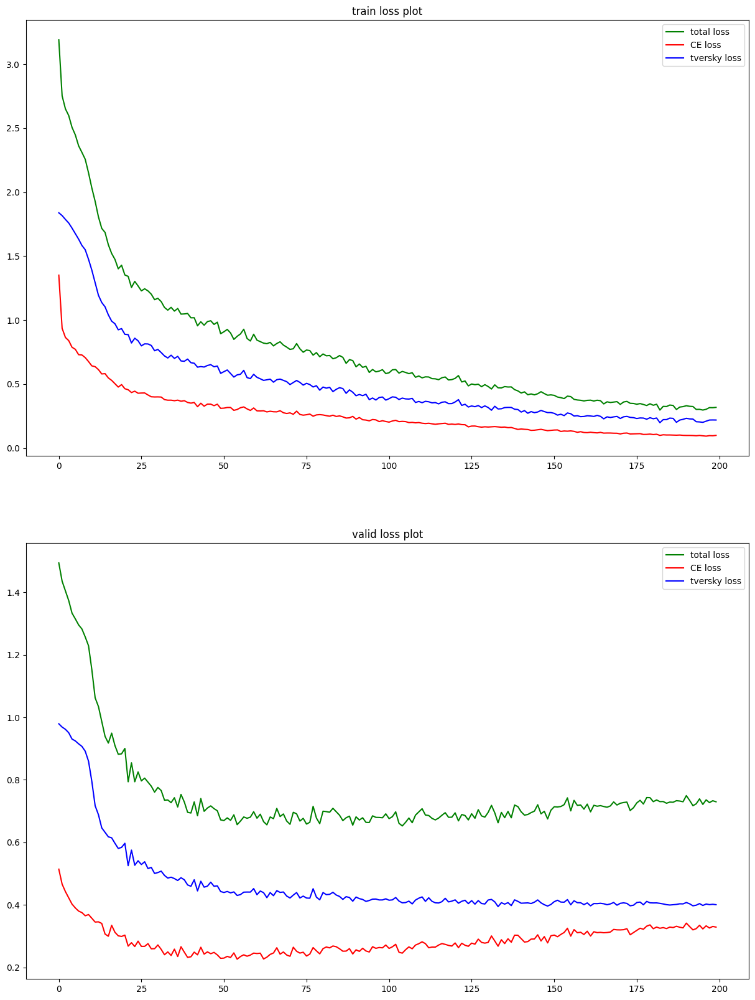

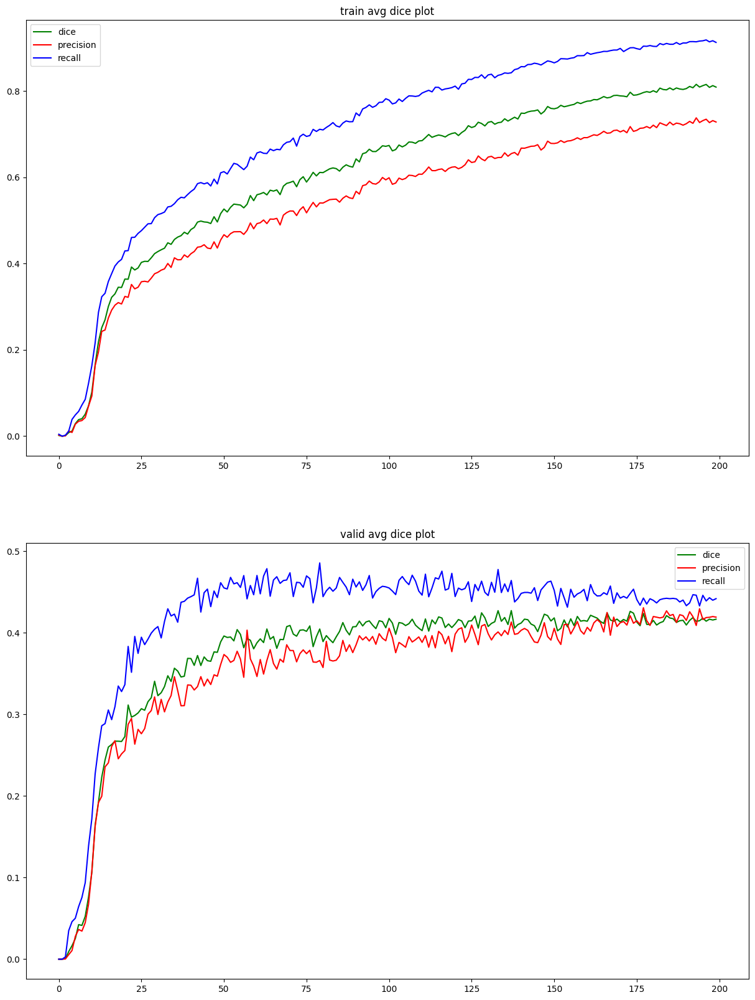

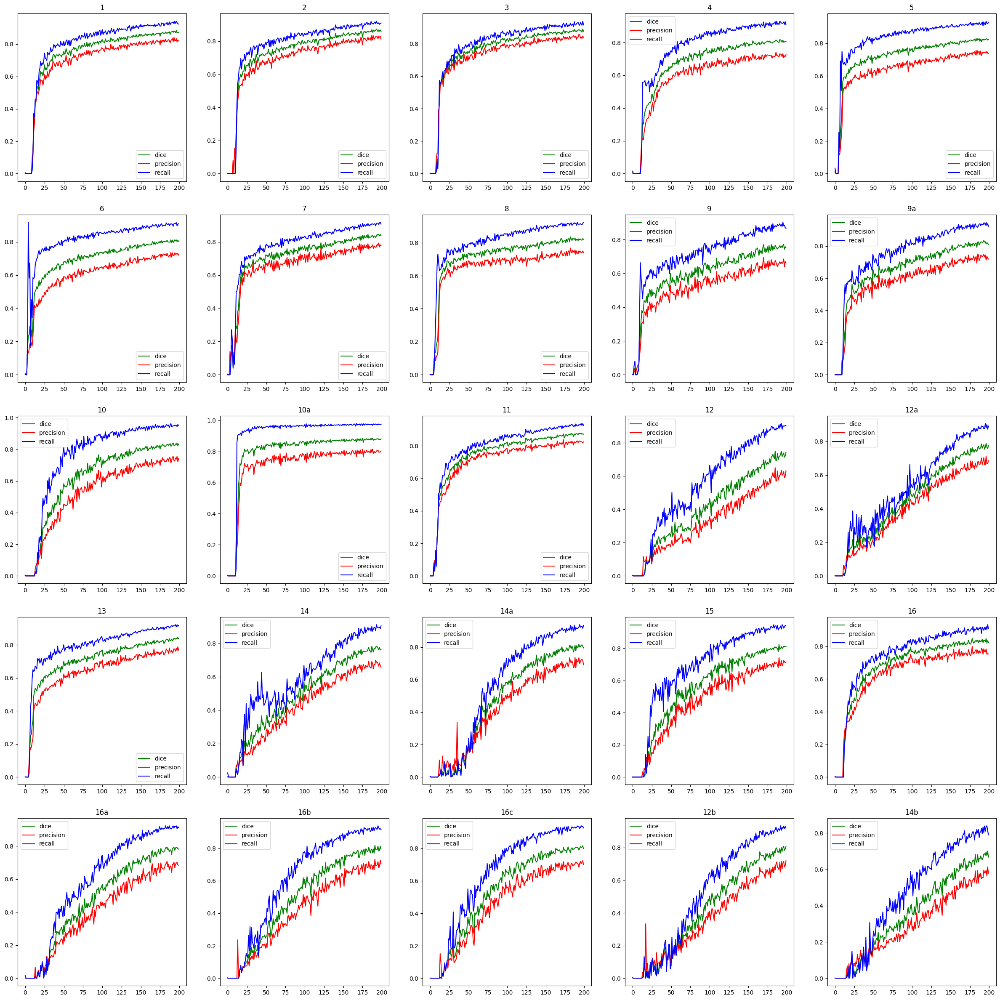

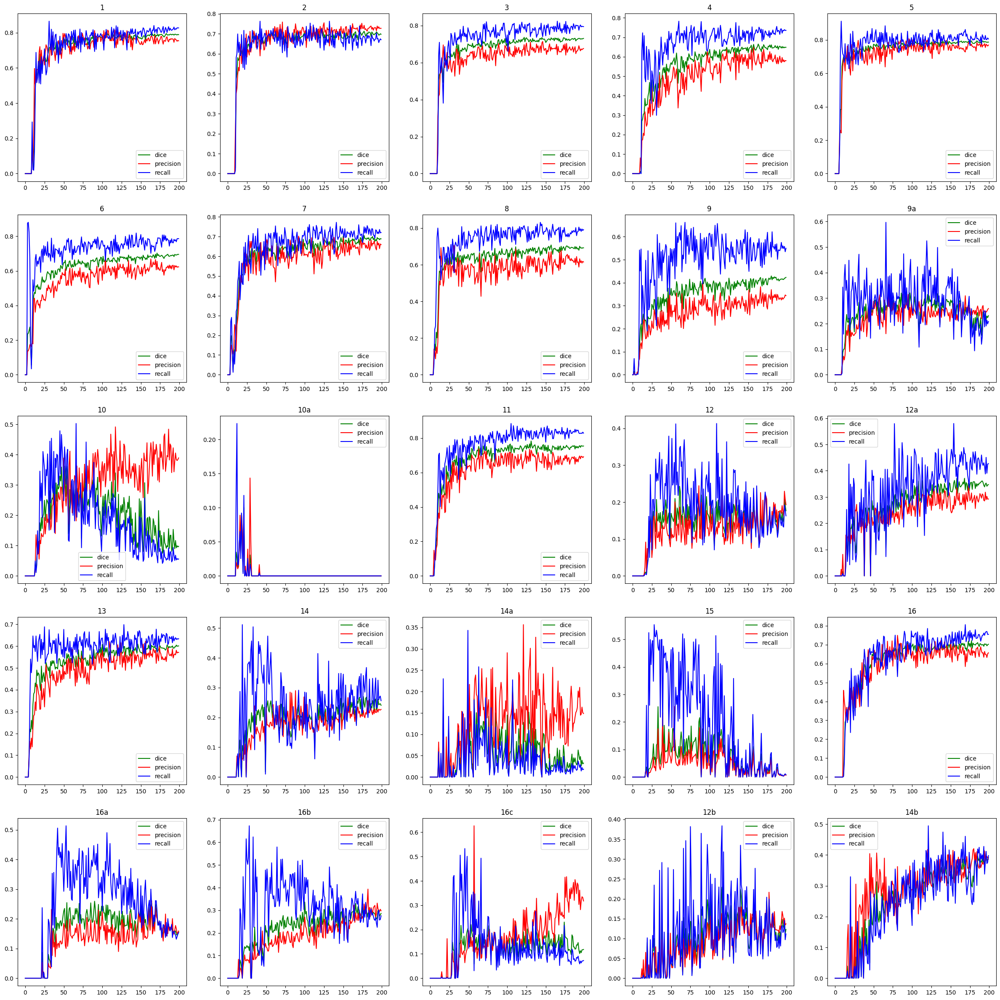

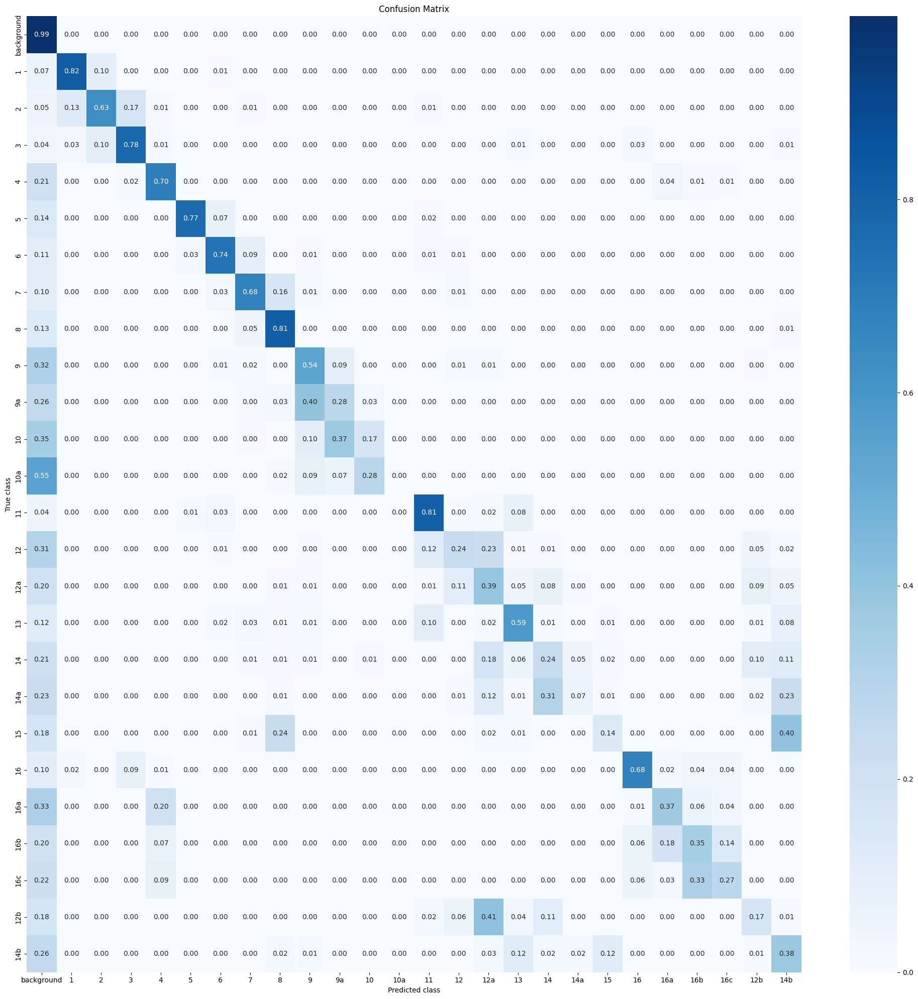

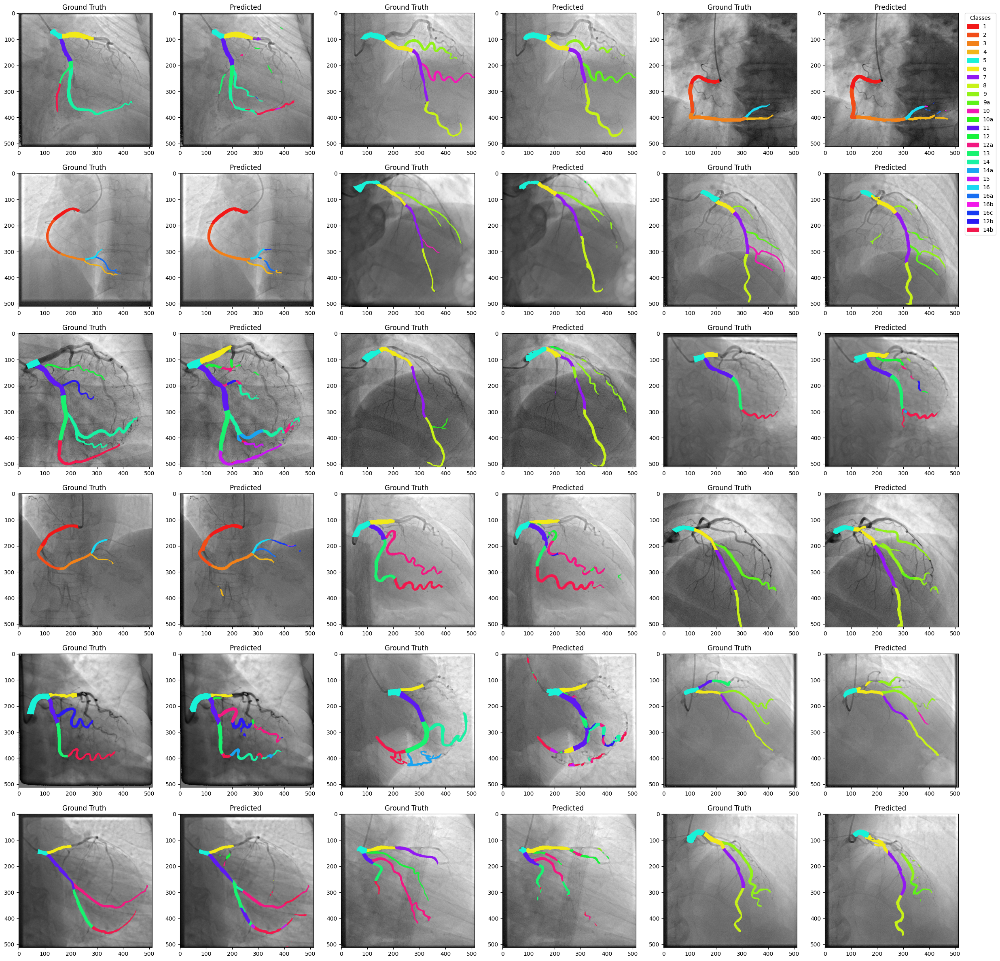

In [11]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    args=args,
    class_map=class_map,
    name=args["name"]
)